In [1]:
from typing import *

from functools import partial
from glob import glob
import math
import os
import random
import sys

gpu_id = 0
os.environ["CUDA_VISIBLE_DEVICES"] = f'{gpu_id}'

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
sns.set_style('white')

import torch
from torch import nn
import torch.distributions as D
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader

In [2]:
from datetime import datetime
import numpy as np             #for numerical computations like log,exp,sqrt etc
import pandas as pd            #for reading & storing data, pre-processing
import matplotlib.pylab as plt #for visualization
#for making sure matplotlib plots are generated in Jupyter notebook itself
%matplotlib inline
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima_model import ARIMA
from matplotlib.pylab import rcParams
# import pandas_datareader.data as web
import matplotlib.pyplot as plt
# import datetime
import FinanceDataReader as fdr
import warnings
import os
import torch
import torchvision
import torch.nn as nn
from torchvision import transforms
from torchvision.utils import save_image
from IPython.display import Image
import matplotlib.pyplot as plt
import glob
from PIL import Image

rcParams['figure.figsize'] = 6, 6

In [9]:
loc = torch.tensor([0.,0.])
scale = torch.tensor([1.,1.])
base_dist = D.Normal(loc, scale)

In [10]:
n_samples = 10000

x_real = torch.FloatTensor(n_samples, 2).normal_(0.5, 0.15)
# x_real = torch.FloatTensor(n_samples, 2).uniform_(0, 1)
xr, yr = x_real[:,0], x_real[:,1]

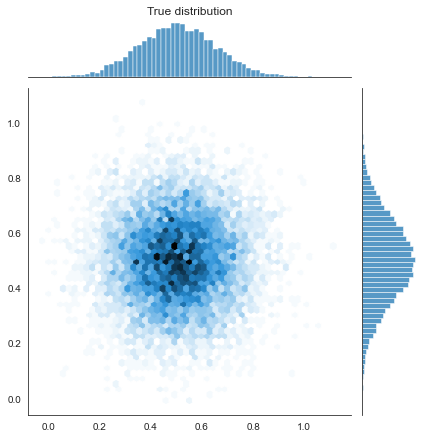

In [11]:
g = sns.jointplot(x=xr, y=yr, kind="hex");
g.ax_marg_x.set_title('True distribution');
# plt.savefig('true_dist.svg')

In [12]:
xlim = g.ax_joint.get_xlim()
ylim = g.ax_joint.get_ylim()

In [13]:
def G_layer_BN(in_c:int, out_c:int):
    return nn.Sequential(
            nn.Linear(in_c, out_c, bias=False),
            nn.BatchNorm1d(out_c),
            nn.LeakyReLU(inplace=True))

def G_layer_SN(in_c:int, out_c:int):
    return nn.Sequential(
            nn.utils.spectral_norm(nn.Linear(in_c, out_c)),
            nn.LeakyReLU(inplace=True))

class Generator(nn.Sequential):
    _layer = staticmethod(G_layer_SN)
    # _layer = staticmethod(G_layer_BN)
    def __init__(self, in_dim:int, out_dim:int, n_layers:int=5, 
                 hidden_dim:int=128, dropout_rate:float=0.):
        super().__init__()
        self.add_module('h1', self._layer(in_dim, hidden_dim))
        for i in range(2, n_layers):
            self.add_module(f'h{i}', self._layer(hidden_dim, hidden_dim))
        if dropout_rate > 0.:
            self.add_module(f'dropout', nn.Dropout(dropout_rate))
        self.add_module(f'h{n_layers}', nn.Linear(hidden_dim, out_dim))

def D_layer_BN(in_c:int, out_c:int):
    return nn.Sequential(
            nn.Linear(in_c, out_c, bias=False),
            nn.BatchNorm1d(out_c),
            nn.LeakyReLU(0.2, inplace=True))

def D_layer_SN(in_c:int, out_c:int):
    return nn.Sequential(
            nn.utils.spectral_norm(nn.Linear(in_c, out_c)),
            nn.LeakyReLU(0.1, inplace=True))

class Discriminator(Generator):
    _layer = staticmethod(D_layer_SN)
    # _layer = staticmethod(D_layer_BN)


In [14]:
device = 'cpu'
hidden_dim = 128
n_layers = 4
dropout_rate = 0.
g_args = (2, 2, n_layers, hidden_dim, dropout_rate)
d_args = (2, 1, n_layers, hidden_dim, dropout_rate)
generator = Generator(*g_args).to(device)
discriminator = Discriminator(*d_args).to(device)

In [15]:
D_final_activation = None
if D_final_activation == 'tanh':
    discriminator.add_module('tanh', nn.Tanh())
elif D_final_activation == 'sigmoid':
    discriminator.add_module('sigmoid', nn.Sigmoid())

In [16]:
def num_params(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [17]:
print(f'Number of trainable parameters in generator: {num_params(generator)}')
print(f'Number of trainable parameters in discriminator: {num_params(discriminator)}')

Number of trainable parameters in generator: 33666
Number of trainable parameters in discriminator: 33537


In [18]:
def weights_init(m):
    name = m.__class__.__name__
    if 'Linear' in name or 'BatchNorm' in name:
        nn.init.normal_(m.weight.data, 0., 0.02)
        if hasattr(m, 'bias'):
            if m.bias is not None:
                nn.init.constant_(m.bias.data, 0.)

generator.apply(weights_init);
discriminator.apply(weights_init);

In [19]:
def gradient_penalty(y, x):
    weight = torch.ones_like(y)
    grad = torch.autograd.grad(outputs=y,
                               inputs=x,
                               grad_outputs=weight,
                               retain_graph=True,
                               create_graph=True,
                               only_inputs=True)[0]
    return torch.mean((grad.norm(dim=1) - 1) ** 2)

### Train the generator and discriminator

In [20]:
n_epochs = 2000
batch_size = len(x_real)
use_minibatches = False


In [21]:
x_real = x_real.to(device)

In [22]:
# gan_type = 'hinge'
gan_type = 'vanilla'
betas = (0.,0.999)  # parameters from self-attention GAN [6]
G_lr = 1e-4
D_lr = 4e-4
D_steps = 1
use_gp = False
gp_weight = 10.
G_opt = torch.optim.Adam(generator.parameters(), lr=G_lr, betas=betas)
D_opt = torch.optim.Adam(discriminator.parameters(), lr=D_lr, betas=betas)

In [23]:
real_label = 1.
fake_label = 0.
real_labels = real_label * torch.ones((batch_size, 1))
fake_labels = fake_label * torch.ones((batch_size, 1))
real_labels = real_labels.to(device)
fake_labels = fake_labels.to(device)

In [24]:
if use_minibatches:
    MyDataLoader = partial(DataLoader, batch_size=batch_size, shuffle=True)
    x_real_dataset = TensorDataset(x_real)
    x_real_dataloader = MyDataLoader(x_real_dataset)

In [25]:
def reset_grad():
    D_opt.zero_grad()
    G_opt.zero_grad()

In [26]:
def train_discriminator(x_real, z):
    for _ in range(D_steps):
        reset_grad()
        
        # discriminate real samples
        D_real = discriminator(x_real)
        if gan_type == 'vanilla':
            loss_real = F.binary_cross_entropy_with_logits(D_real, real_labels)
            D_x = torch.sigmoid(D_real).mean().item()
        elif gan_type == 'lsgan':
            loss_real = torch.mean((D_real - real_label)**2)
            D_x = D_real.mean().item()
        elif gan_type == 'wgan-gp':
            loss_real = D_real.mean()
            D_x = loss_real.item()
        elif gan_type == 'hinge':
            loss_real = F.relu(1. - D_real).mean()
            D_x = loss_real.item()
        else:
            raise NotImplementedError(f'{gan_type} not implemented.')

        # discriminate fake samples
        with torch.no_grad():
            x_fake = generator(z)
        D_fake = discriminator(x_fake)
        if gan_type == 'vanilla':
            loss_fake = F.binary_cross_entropy_with_logits(D_fake, fake_labels)
            D_G_z_1 = torch.sigmoid(D_fake).mean().item()
        elif gan_type == 'lsgan':
            loss_fake = torch.mean((D_fake - fake_label)**2)
            D_G_z_1 = D_fake.mean().item()
        elif gan_type == 'wgan-gp':
            loss_fake = D_fake.mean()
            D_G_z_1 = loss_fake.item()
        elif gan_type == 'hinge':
            loss_fake = F.relu(1. + D_fake).mean()
            D_G_z_1 = loss_fake.item()
        else:
            raise NotImplementedError(f'{gan_type} not implemented.')
        
        if use_gp or gan_type == 'wgan-gp':
            eps = torch.rand(batch_size,1).to(device)
            x_hat = (eps*x_real + (1.-eps)*x_fake)
            x_hat.requires_grad_(True)
            D_x_hat = discriminator(x_hat)
            gp = gradient_penalty(D_x_hat, x_hat)

        if gan_type != 'wgan-gp':
            D_loss = 0.5 * (loss_fake + loss_real)
            if use_gp:
                D_loss += gp_weight * gp
        else:
            D_loss = loss_fake - loss_real + gp_weight * gp

        D_loss.backward()
        D_opt.step()
    
    return D_loss.item(), D_x, D_G_z_1

def train_generator(z):
    reset_grad()
    x_fake = generator(z)
    D_fake = discriminator(x_fake)
    if gan_type == 'vanilla':
        G_loss = F.binary_cross_entropy_with_logits(D_fake, real_labels)
        D_G_z_2 = torch.sigmoid(D_fake).mean().item()
    elif gan_type == 'lsgan':
        G_loss = 0.5 * torch.mean(D_fake**2)
        D_G_z_2 = D_fake.mean().item()
    elif gan_type == 'wgan-gp':
        G_loss = -D_fake.mean()
        D_G_z_2 = G_loss.item()
    elif gan_type == 'hinge':
        G_loss = -D_fake.mean()
        D_G_z_2 = G_loss.item()
    else:
        raise NotImplementedError(f'{gan_type} not implemented.')

    G_loss.backward()
    G_opt.step()
    
    return G_loss.item(), D_G_z_2

In [27]:
center = 0.5
from scipy.stats import norm

def plot_data(x_real, x_fake, frame_str, path=None):
    # Start plot
    plt.ioff()
    plt.figure(figsize=(9, 9.5))
    plt.rc('font', size=15)
    plt.title('GAN for 2D Data (%s frame)'%(frame_str), fontsize=15, family='monospace')
    plt.axis('off')
    
    # Define values
    left, width = 0.1, 0.65
    bottom, height = 0.1, 0.55
    bottom_h = bottom + height + 0.02
    left_h = left + width + 0.02
    plot_bins = np.arange(-1, 1 + 0.0001, 0.0001)
    hist_bins = np.arange(-1, 1 + 0.025, 0.025)
    
    # Generate multiple axes
    ax_2d = plt.axes([left, bottom, width, height])
    ax_x1 = plt.axes([left, bottom_h, width, 0.2])
    ax_x2 = plt.axes([left_h, bottom, 0.2, height])
    
    def disable_ticks(target):
        target.tick_params(axis='both', which='both',
                           bottom='off', top='off', left='off', right='off',
                           labelbottom='off', labeltop='off', labelleft='off', labelright='off')
    disable_ticks(ax_2d)
    disable_ticks(ax_x1)
    disable_ticks(ax_x2)
    
    ax_2d.tick_params(axis='both', which='major', bottom='on', left='on', labelbottom='on', labelleft='on')
    ax_x1.tick_params(axis='both', which='major', bottom='on')
    ax_x2.tick_params(axis='both', which='major', left='on')
    
    # Draw 2D
    ax_2d.scatter(x_fake[:,0], x_fake[:,1], s=30, c='red',  alpha=0.25)
    mesh_grid = np.mgrid[-1+center:1+center:0.01, -1+center:1+center:0.01]
    from scipy.stats import multivariate_normal
    rv = multivariate_normal([np.mean(x_real[:,0]), np.mean(x_real[:,1])], [[np.std(x_real[:,0]), 0], [0, np.std(x_real[:,1])]])
    ax_2d.contour(mesh_grid[0], mesh_grid[1], rv.pdf(np.dstack((mesh_grid[0], mesh_grid[1]))), 10, cmap='Blues', linewidths=2.5)
    ax_2d.set_xlim((-1+center, 1+center))
    ax_2d.set_xticks([-1+center, -0.5+center, 0+center, 0.5+center, 1+center])
    ax_2d.set_ylim((-1+center, 1+center))
    ax_2d.set_yticks([-1+center, -0.5+center, 0+center, 0.5+center, 1+center])
    
    # Draw x_1
    ax_x1.hist(x_fake[:,0], hist_bins, density=True, facecolor='red', alpha=0.5, histtype='bar', rwidth=0.8)
    ax_x1.plot(plot_bins, norm.pdf(plot_bins, x_real[:,0].mean(), x_real[:,0].std()), 'b-', linewidth=2.5)
    ax_x1.set_xlim((-1+center, 1+center))
    ax_x1.set_ylim((0, 4))
    ax_x1.set_xticks([-1+center, -0.5+center, 0+center, 0.5+center, 1+center])
    
    # Draw x_2
    ax_x2.hist(x_fake[:,1], hist_bins, density=True, facecolor='red', alpha=0.5, histtype='bar', rwidth=0.8, orientation='horizontal')    
    ax_x2.plot(norm.pdf(plot_bins, x_real[:,1].mean(), x_real[:,1].std()), plot_bins, 'b-', linewidth=2.5)
    ax_x2.set_xlim((0, 6))
    ax_x2.set_ylim((-1+center, 1+center))
    ax_x2.set_yticks([-1+center, -0.5+center, 0+center, 0.5+center, 1+center])

    # Finish the work
    # path == None and plt.show() or plt.savefig(path, bbox_inches='tight')
    plt.show()
    plt.close()

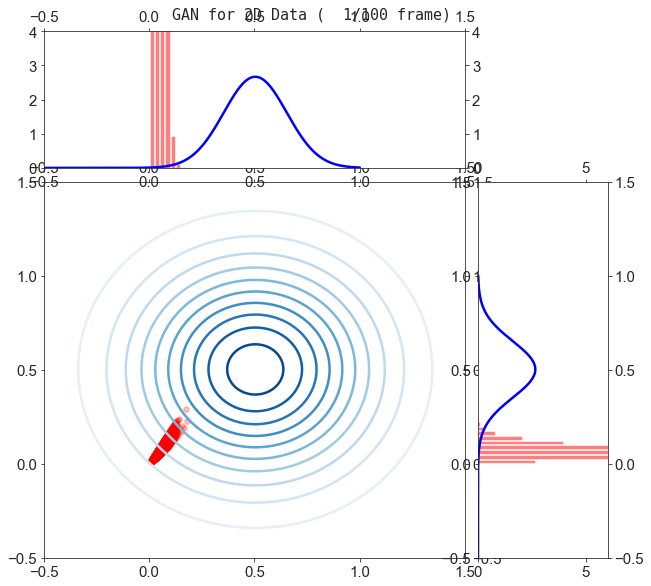

Epoch 20: D_loss=0.6816, G_loss=0.6972, D(x): 0.510, D(G(z)): 0.498/0.498


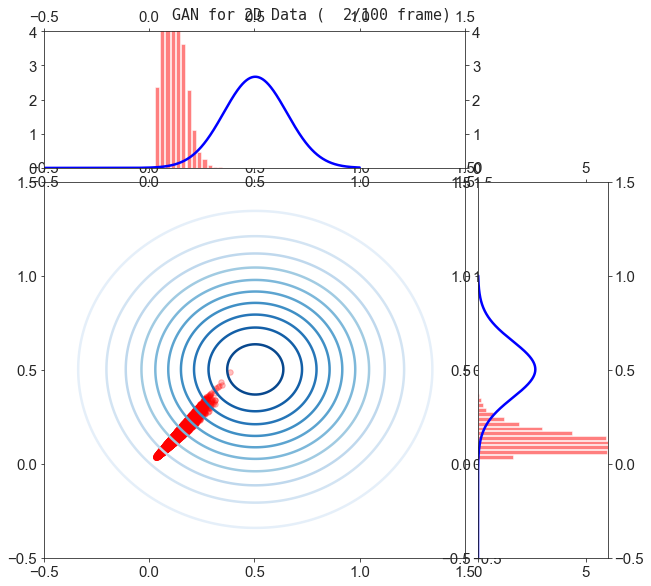

Epoch 40: D_loss=0.6624, G_loss=0.7024, D(x): 0.527, D(G(z)): 0.496/0.495


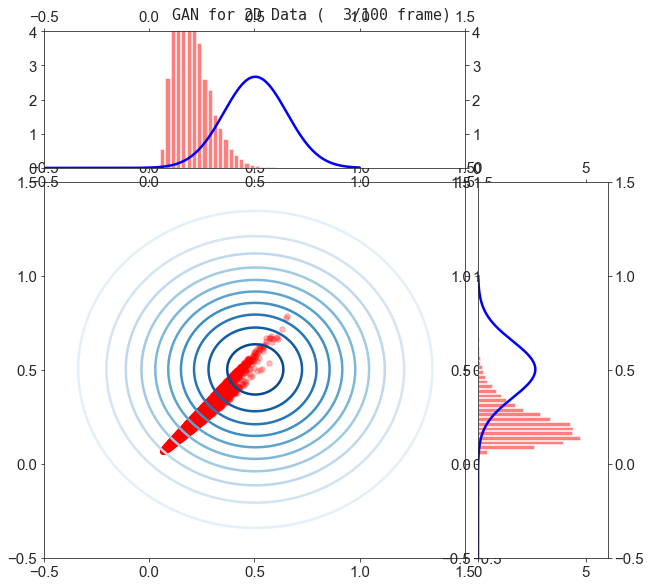

Epoch 60: D_loss=0.6626, G_loss=0.7074, D(x): 0.527, D(G(z)): 0.495/0.493


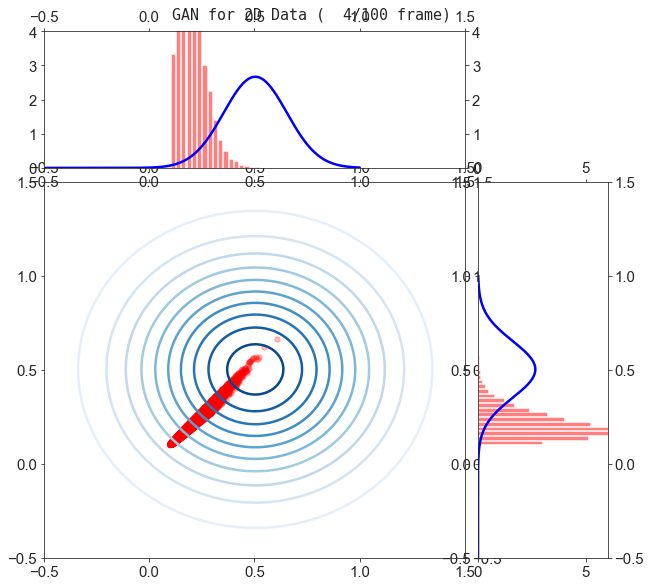

Epoch 80: D_loss=0.6533, G_loss=0.7230, D(x): 0.527, D(G(z)): 0.486/0.485


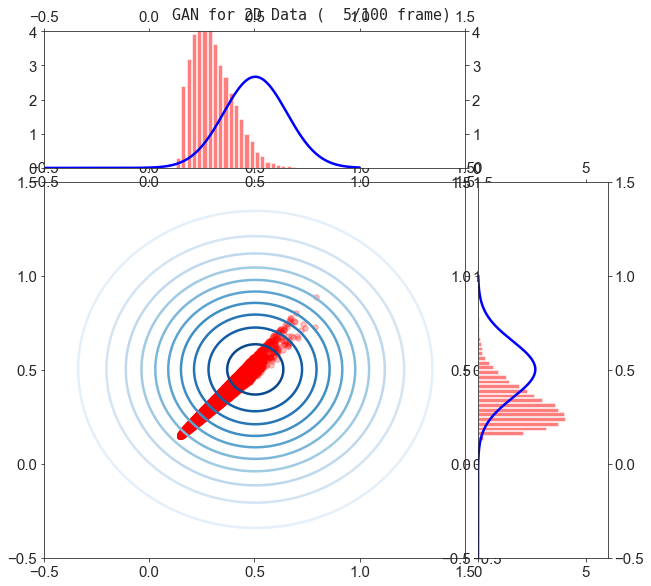

Epoch 100: D_loss=0.6609, G_loss=0.7186, D(x): 0.521, D(G(z)): 0.488/0.488


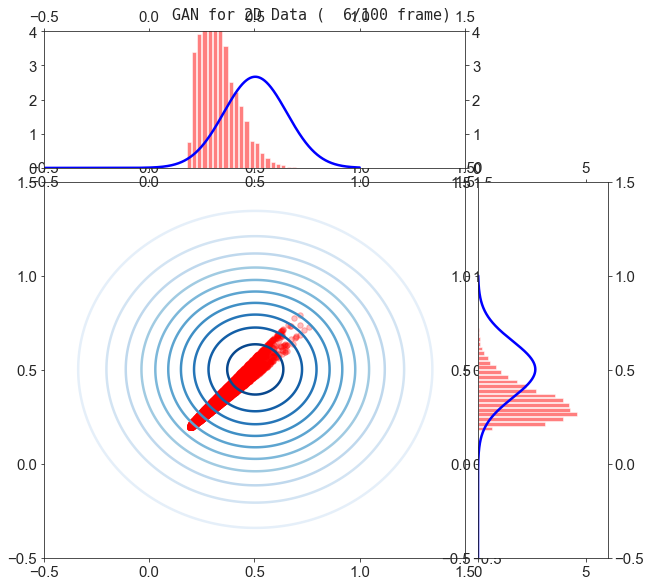

Epoch 120: D_loss=0.6642, G_loss=0.7216, D(x): 0.516, D(G(z)): 0.486/0.486


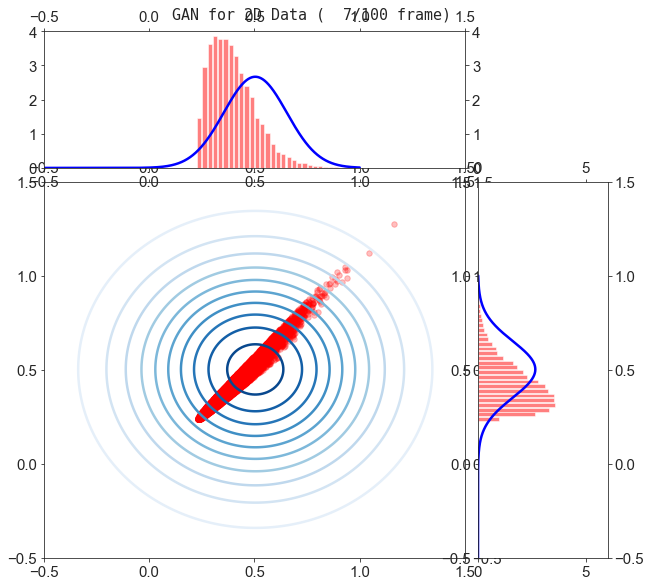

Epoch 140: D_loss=0.6883, G_loss=0.7081, D(x): 0.503, D(G(z)): 0.497/0.493


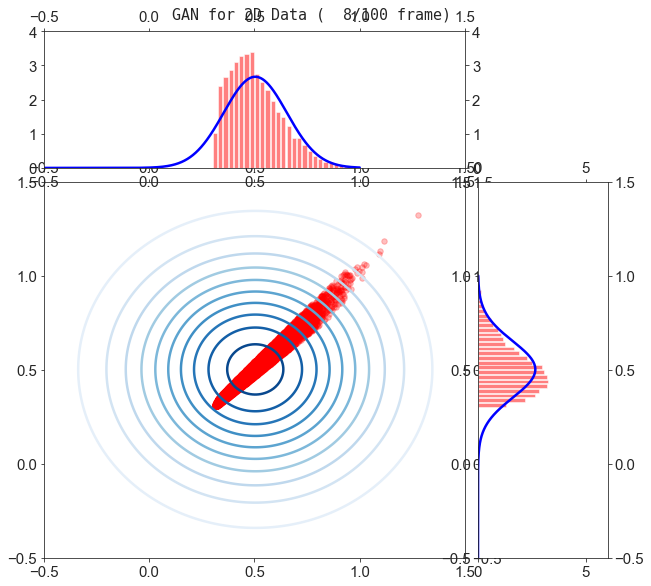

Epoch 160: D_loss=0.6911, G_loss=0.7004, D(x): 0.501, D(G(z)): 0.498/0.497


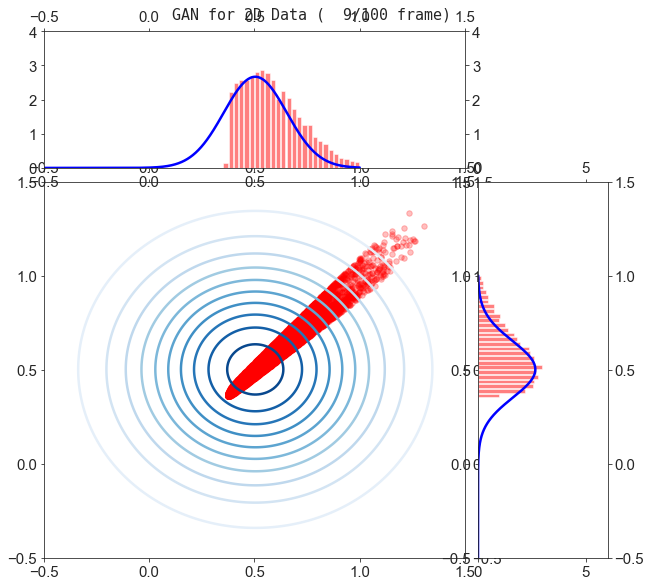

Epoch 180: D_loss=0.6957, G_loss=0.7136, D(x): 0.489, D(G(z)): 0.492/0.490


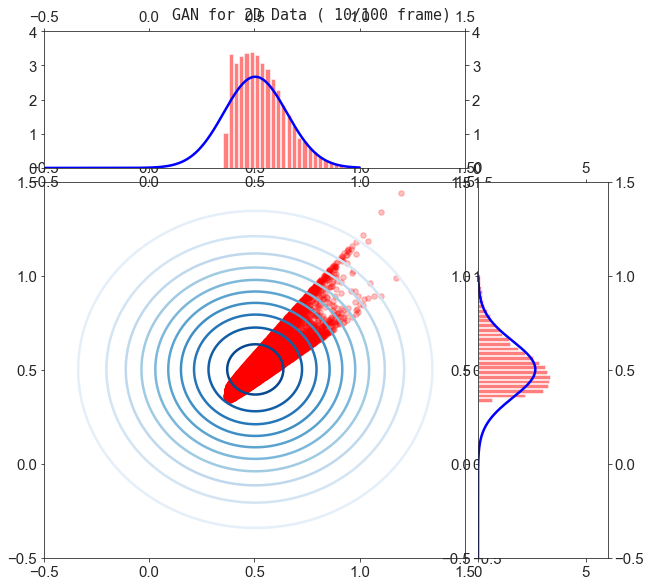

Epoch 200: D_loss=0.6889, G_loss=0.7138, D(x): 0.494, D(G(z)): 0.489/0.490


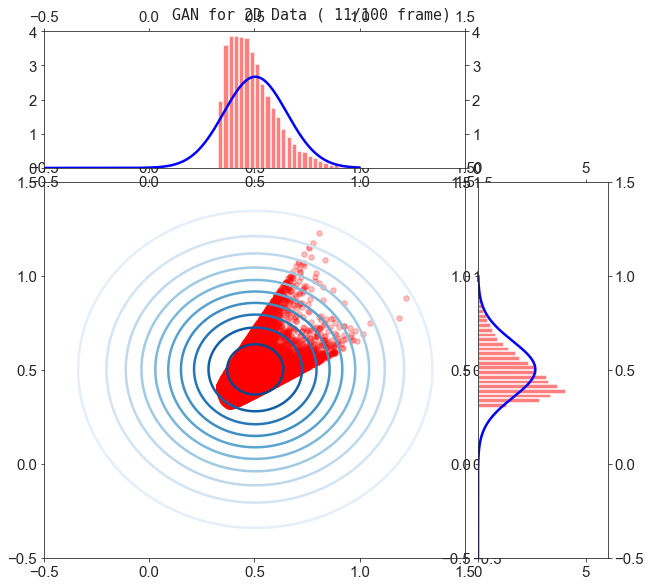

Epoch 220: D_loss=0.6901, G_loss=0.6991, D(x): 0.500, D(G(z)): 0.497/0.497


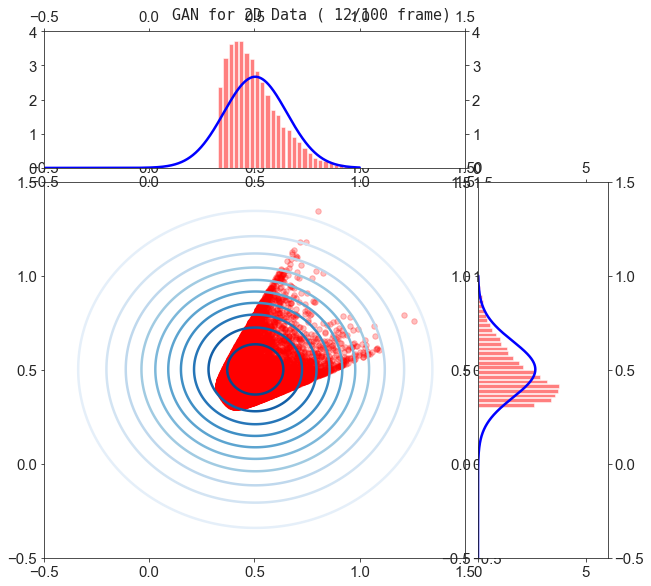

Epoch 240: D_loss=0.6910, G_loss=0.6937, D(x): 0.501, D(G(z)): 0.499/0.500


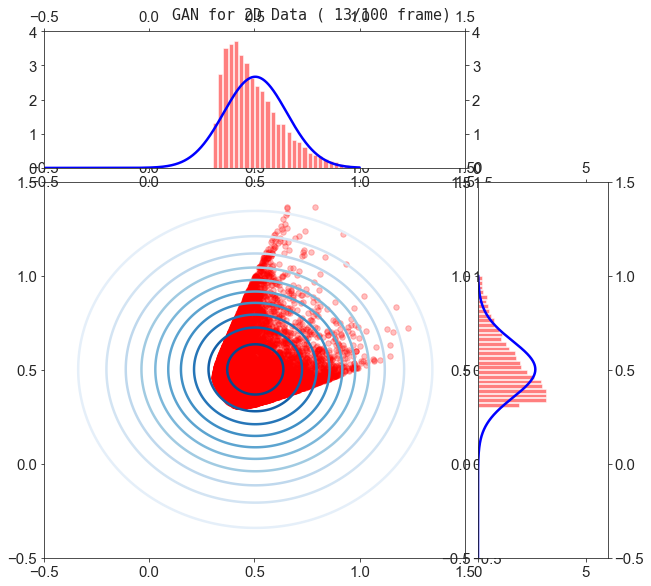

Epoch 260: D_loss=0.6920, G_loss=0.6959, D(x): 0.500, D(G(z)): 0.499/0.499


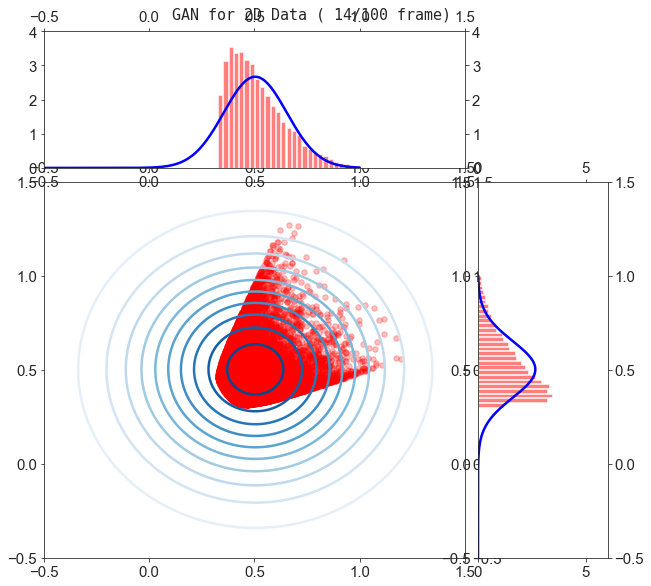

Epoch 280: D_loss=0.6919, G_loss=0.6975, D(x): 0.500, D(G(z)): 0.499/0.498


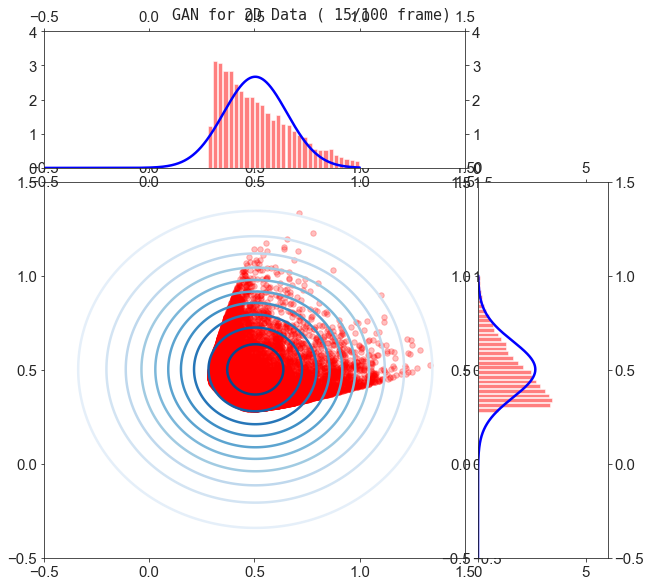

Epoch 300: D_loss=0.6925, G_loss=0.6974, D(x): 0.498, D(G(z)): 0.498/0.498


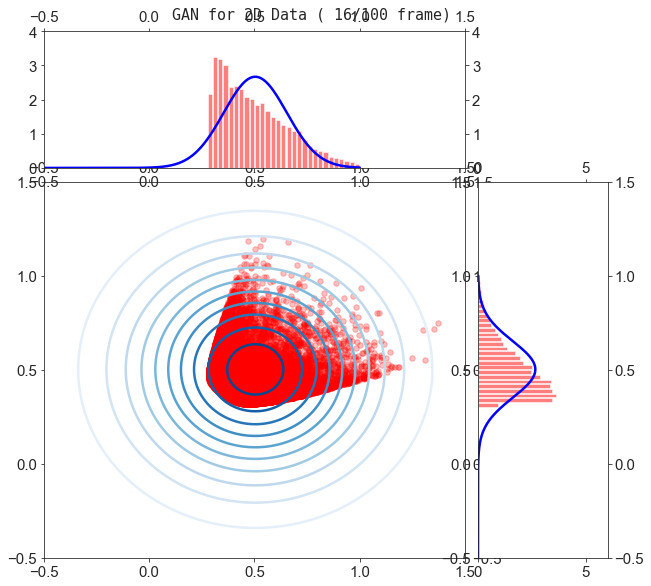

Epoch 320: D_loss=0.6922, G_loss=0.6951, D(x): 0.500, D(G(z)): 0.499/0.499


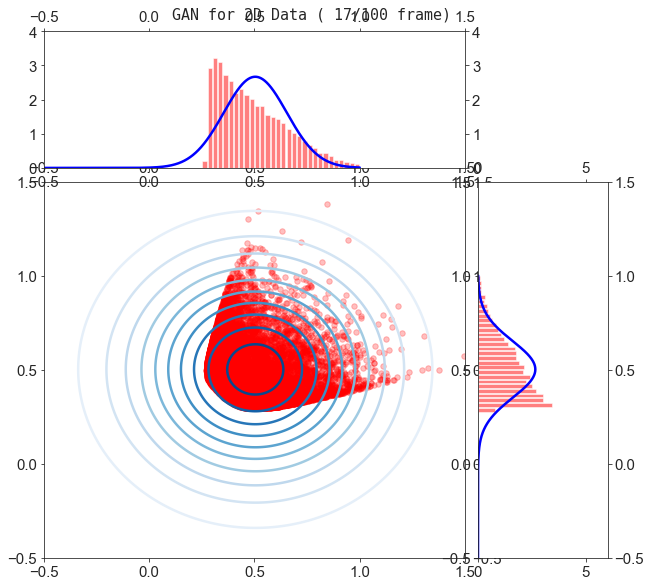

Epoch 340: D_loss=0.6923, G_loss=0.6945, D(x): 0.500, D(G(z)): 0.499/0.499


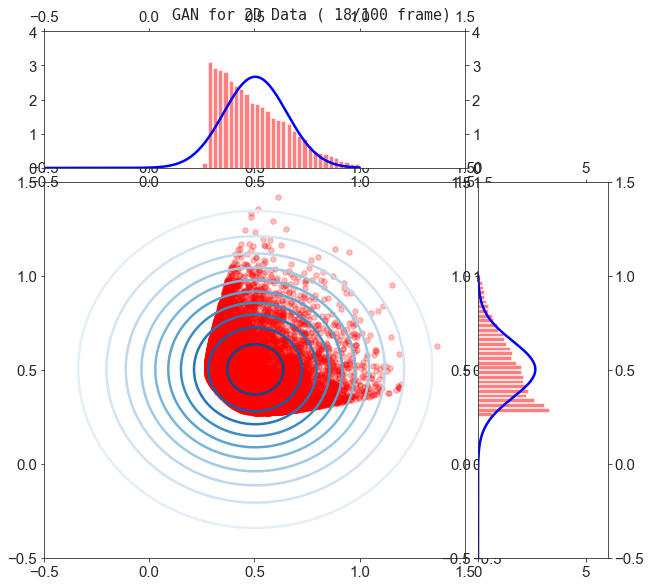

Epoch 360: D_loss=0.6924, G_loss=0.6938, D(x): 0.500, D(G(z)): 0.500/0.500


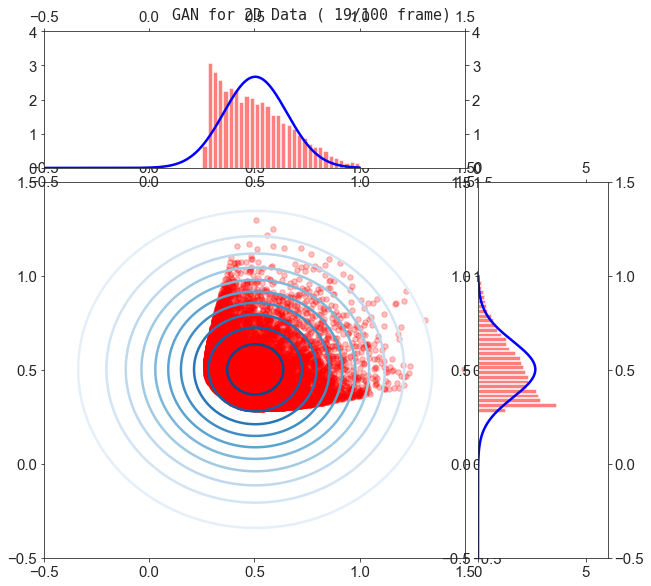

Epoch 380: D_loss=0.6923, G_loss=0.6953, D(x): 0.500, D(G(z)): 0.499/0.499


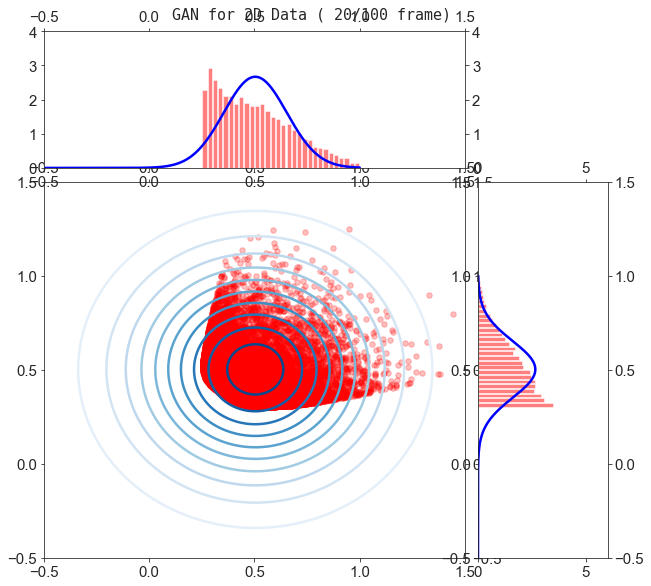

Epoch 400: D_loss=0.6922, G_loss=0.6945, D(x): 0.501, D(G(z)): 0.500/0.499


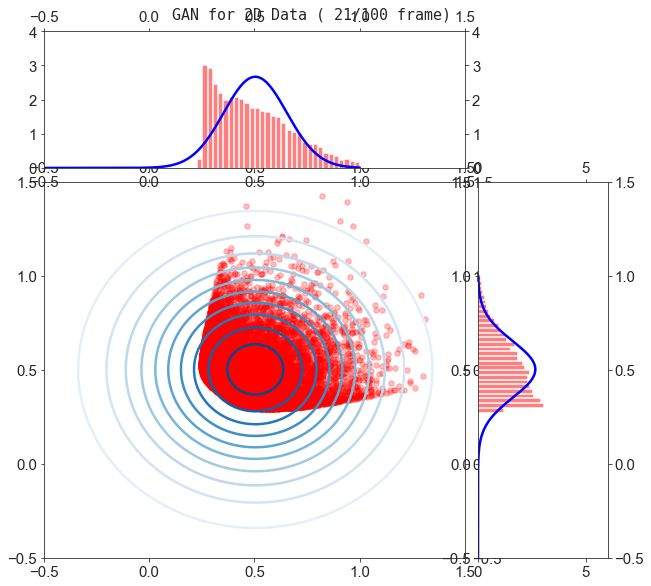

Epoch 420: D_loss=0.6921, G_loss=0.6950, D(x): 0.500, D(G(z)): 0.499/0.499


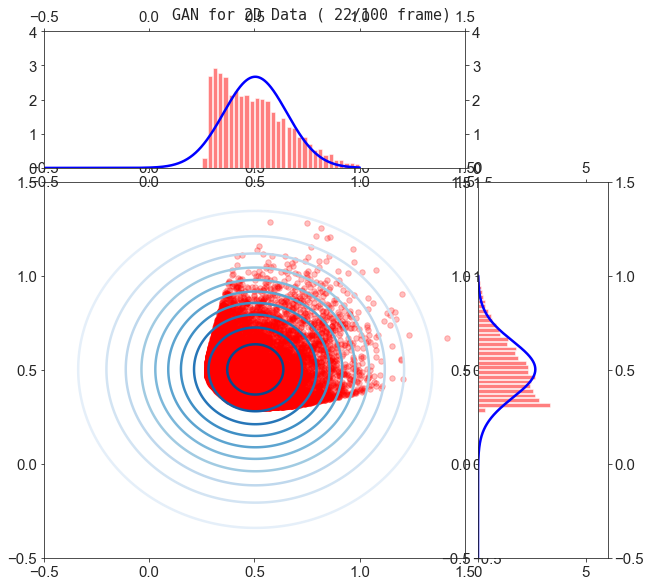

Epoch 440: D_loss=0.6920, G_loss=0.6954, D(x): 0.500, D(G(z)): 0.499/0.499


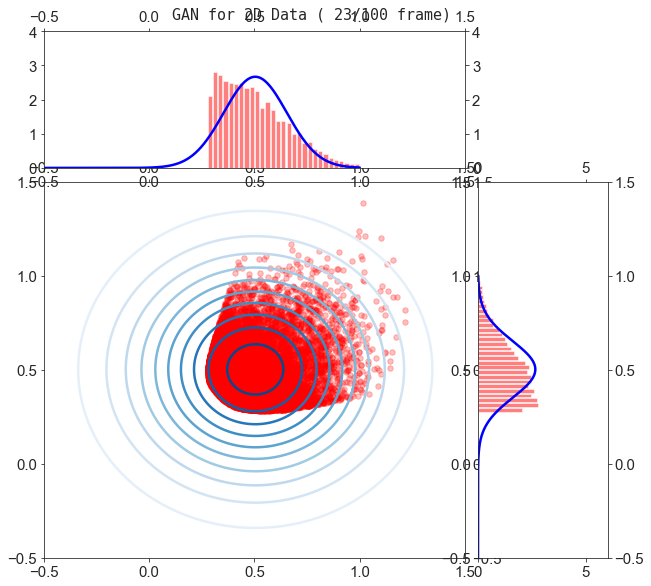

Epoch 460: D_loss=0.6920, G_loss=0.6957, D(x): 0.500, D(G(z)): 0.499/0.499


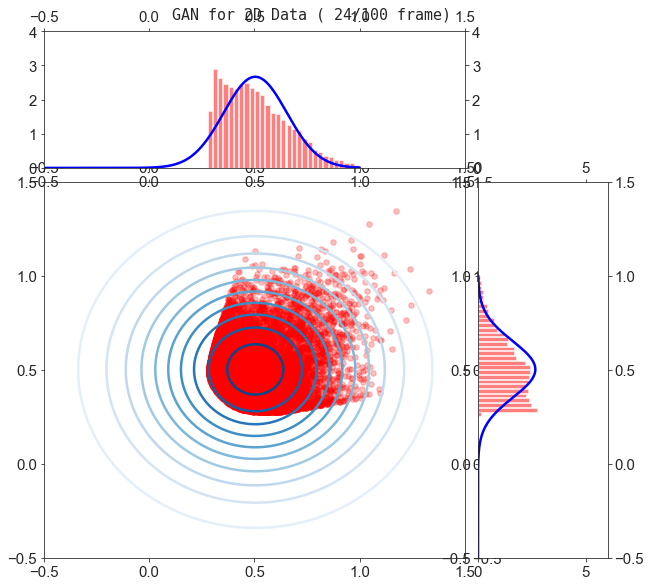

Epoch 480: D_loss=0.6921, G_loss=0.6950, D(x): 0.500, D(G(z)): 0.499/0.499


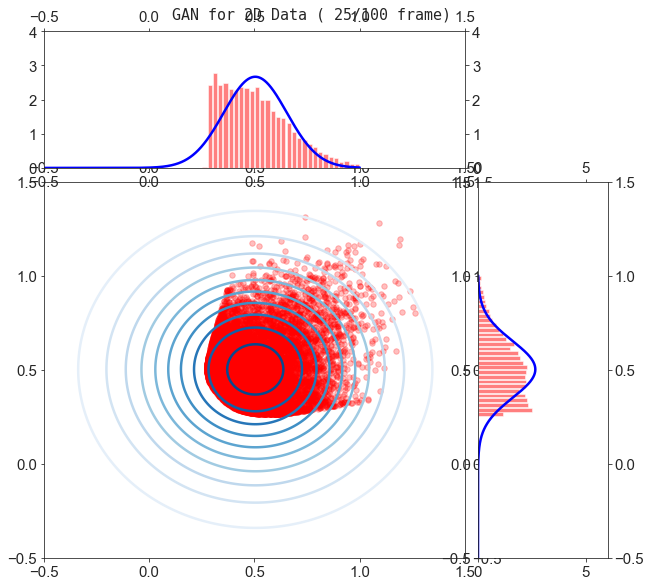

Epoch 500: D_loss=0.6921, G_loss=0.6958, D(x): 0.500, D(G(z)): 0.499/0.499


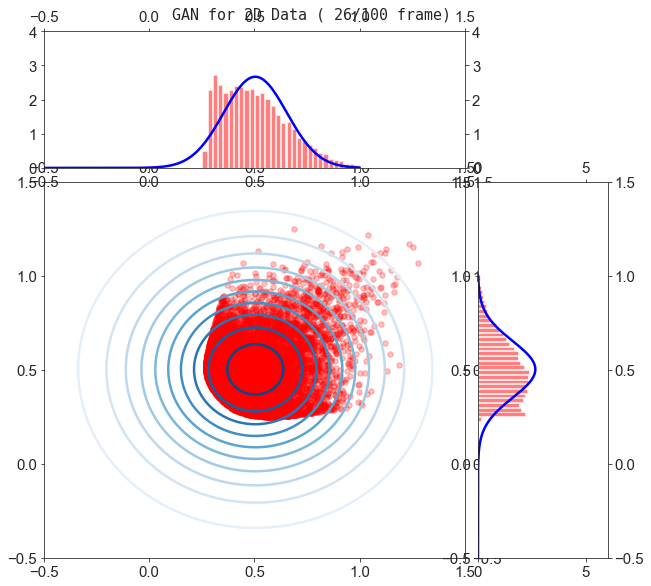

Epoch 520: D_loss=0.6921, G_loss=0.6949, D(x): 0.500, D(G(z)): 0.499/0.499


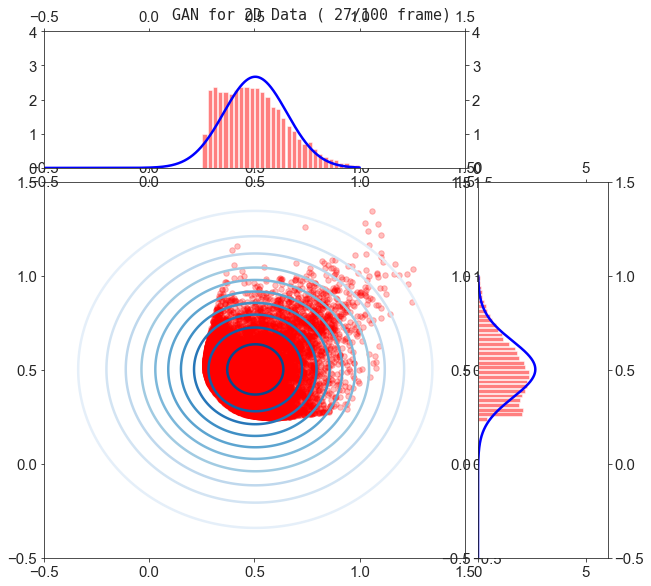

Epoch 540: D_loss=0.6922, G_loss=0.6935, D(x): 0.501, D(G(z)): 0.500/0.500


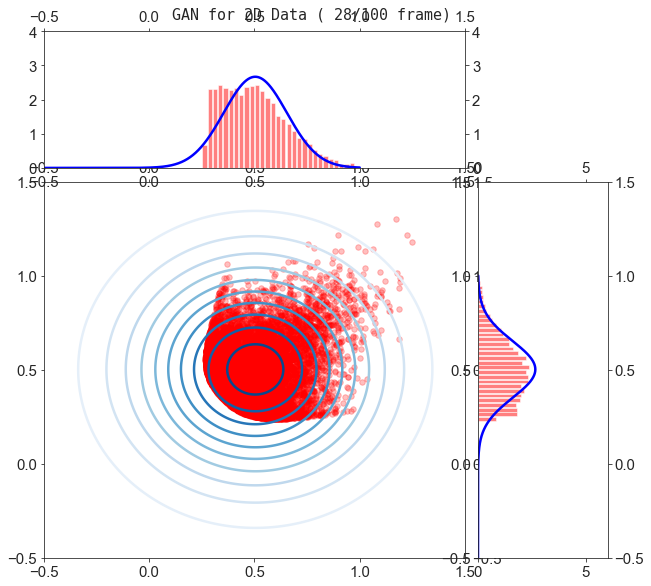

Epoch 560: D_loss=0.6921, G_loss=0.6953, D(x): 0.500, D(G(z)): 0.499/0.499


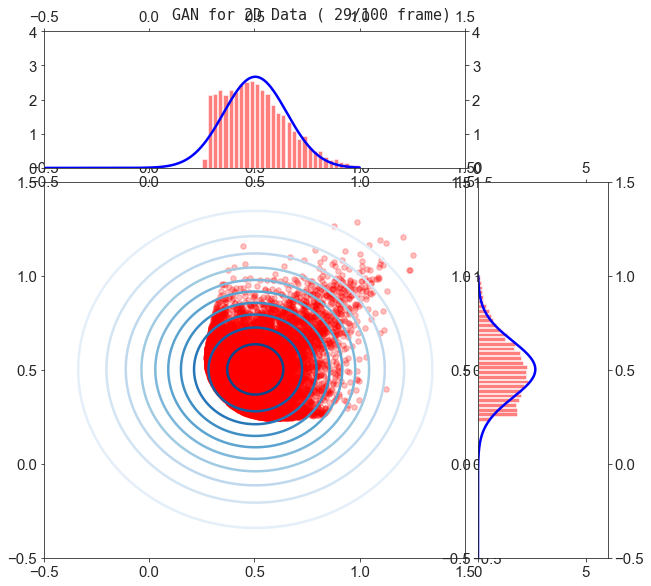

Epoch 580: D_loss=0.6920, G_loss=0.6931, D(x): 0.501, D(G(z)): 0.500/0.500


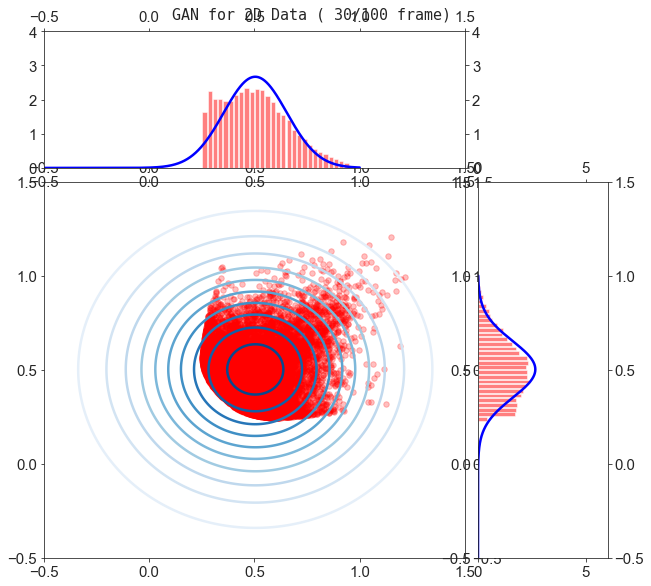

Epoch 600: D_loss=0.6921, G_loss=0.6950, D(x): 0.500, D(G(z)): 0.499/0.499


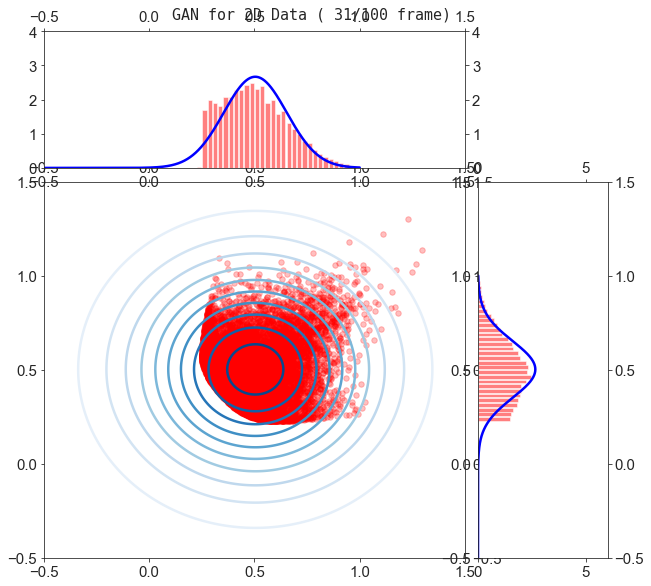

Epoch 620: D_loss=0.6920, G_loss=0.6949, D(x): 0.500, D(G(z)): 0.499/0.499


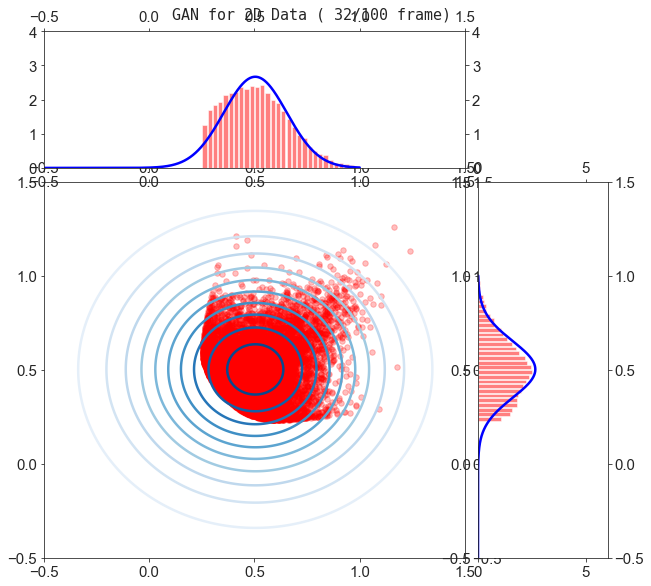

Epoch 640: D_loss=0.6920, G_loss=0.6940, D(x): 0.500, D(G(z)): 0.499/0.500


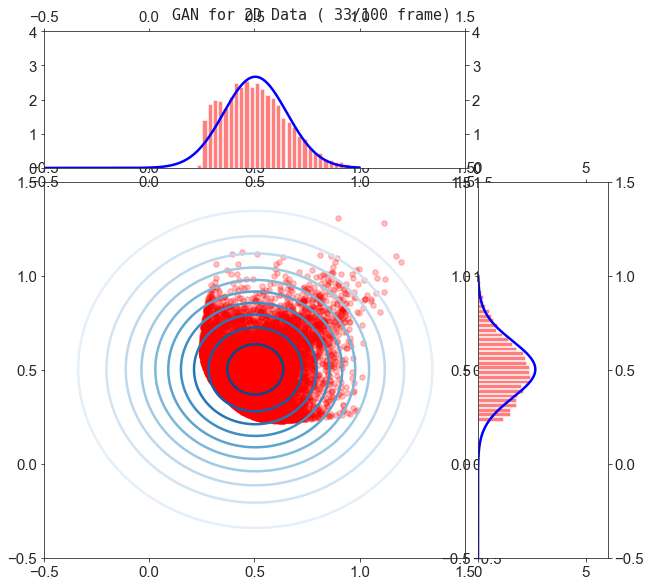

Epoch 660: D_loss=0.6919, G_loss=0.6949, D(x): 0.500, D(G(z)): 0.499/0.499


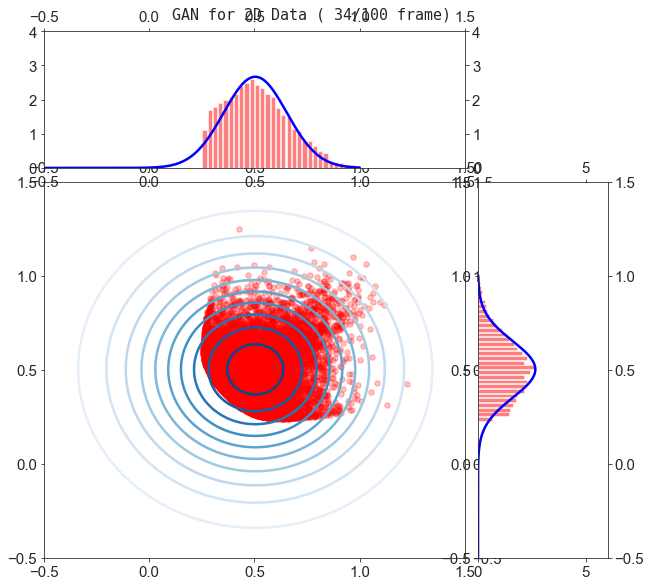

Epoch 680: D_loss=0.6918, G_loss=0.6923, D(x): 0.501, D(G(z)): 0.500/0.500


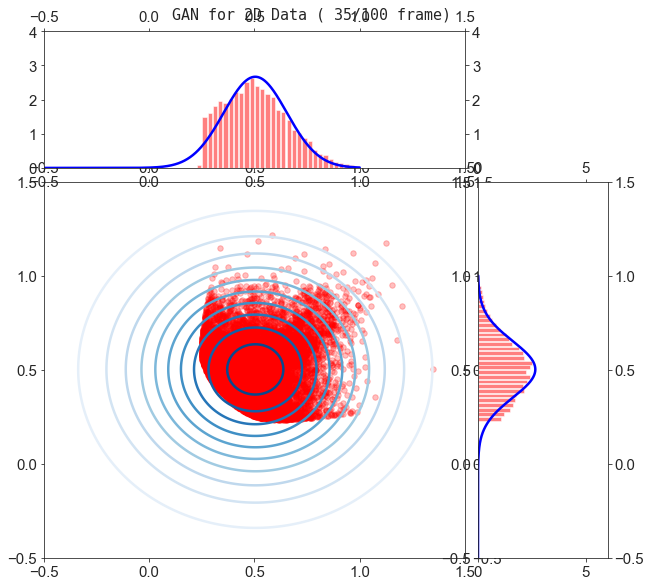

Epoch 700: D_loss=0.6919, G_loss=0.6933, D(x): 0.501, D(G(z)): 0.500/0.500


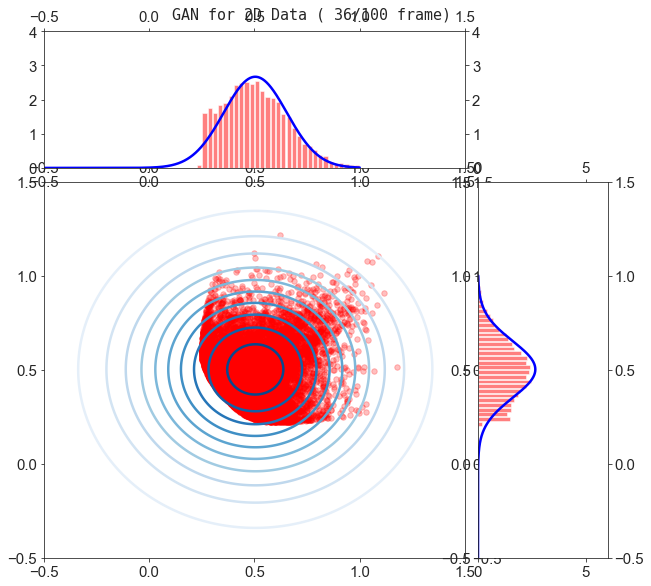

Epoch 720: D_loss=0.6920, G_loss=0.6946, D(x): 0.501, D(G(z)): 0.500/0.499


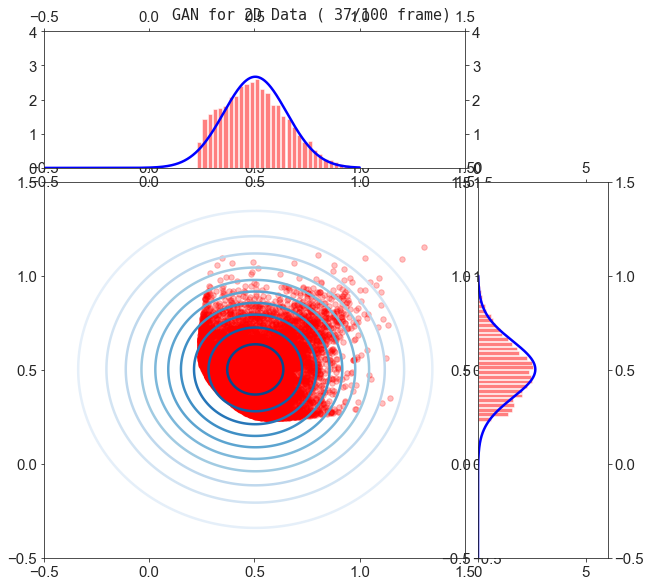

Epoch 740: D_loss=0.6919, G_loss=0.6930, D(x): 0.501, D(G(z)): 0.499/0.500


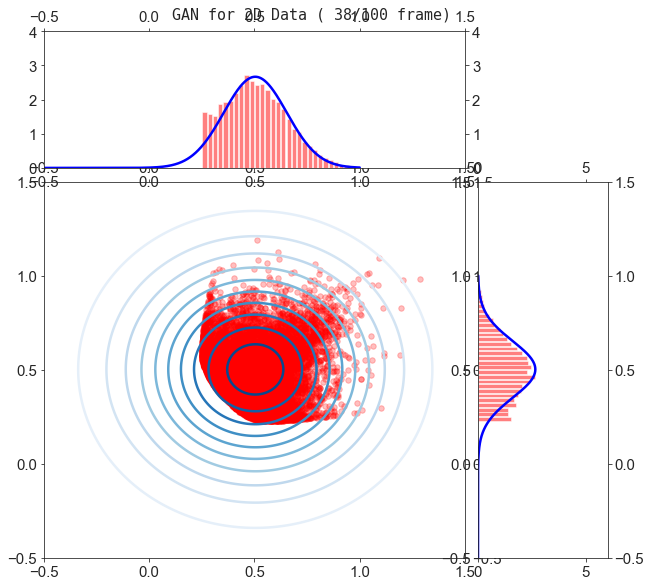

Epoch 760: D_loss=0.6920, G_loss=0.6943, D(x): 0.500, D(G(z)): 0.499/0.499


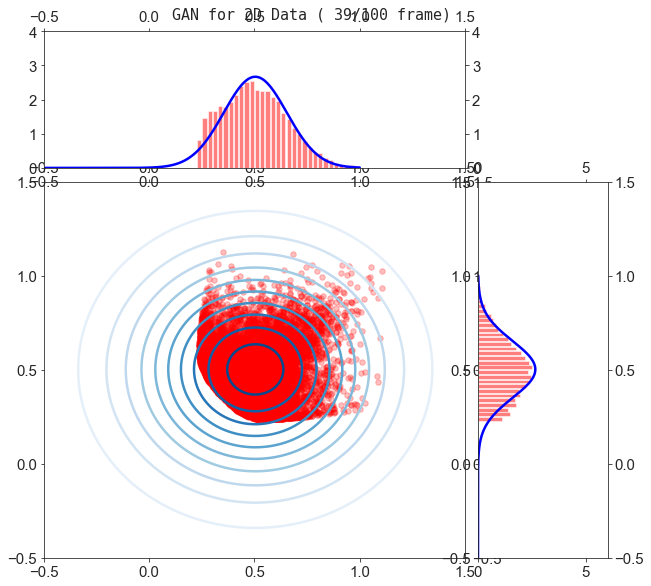

Epoch 780: D_loss=0.6917, G_loss=0.6919, D(x): 0.502, D(G(z)): 0.500/0.501


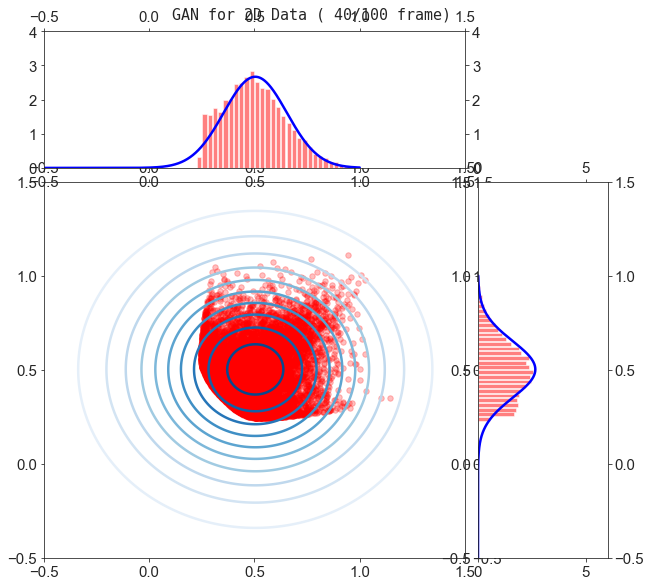

Epoch 800: D_loss=0.6919, G_loss=0.6944, D(x): 0.501, D(G(z)): 0.499/0.499


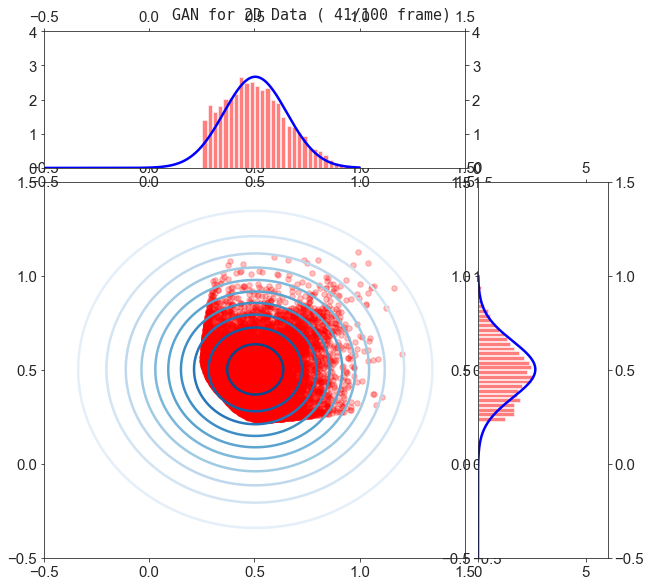

Epoch 820: D_loss=0.6920, G_loss=0.6955, D(x): 0.500, D(G(z)): 0.499/0.499


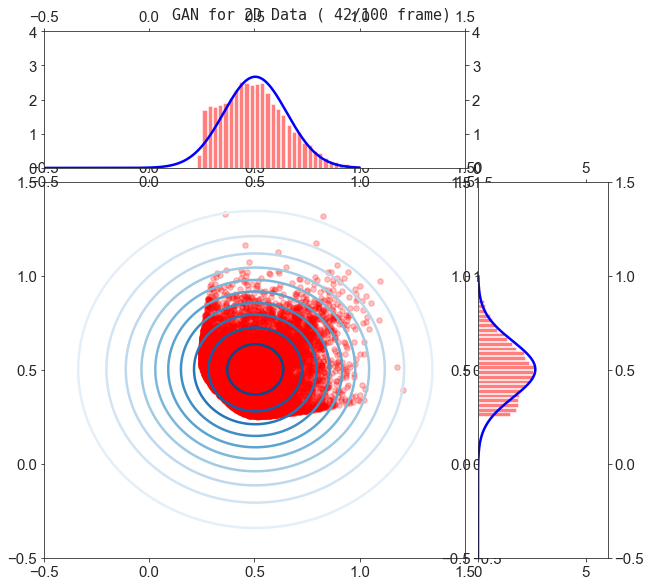

Epoch 840: D_loss=0.6917, G_loss=0.6925, D(x): 0.501, D(G(z)): 0.500/0.500


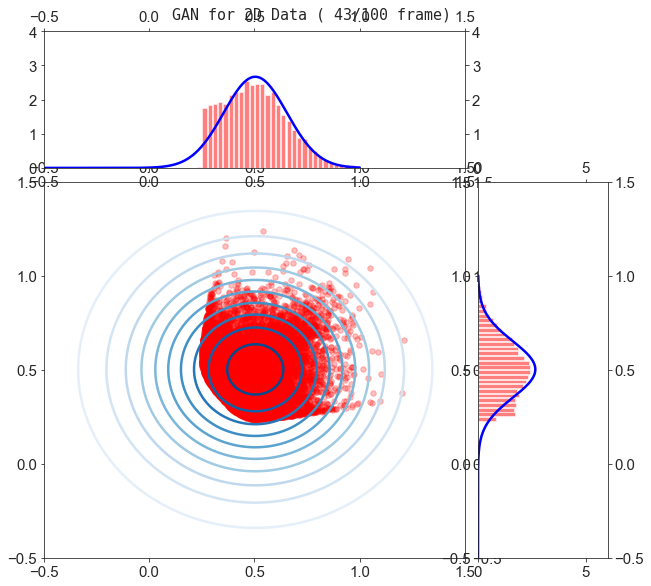

Epoch 860: D_loss=0.6918, G_loss=0.6910, D(x): 0.502, D(G(z)): 0.501/0.501


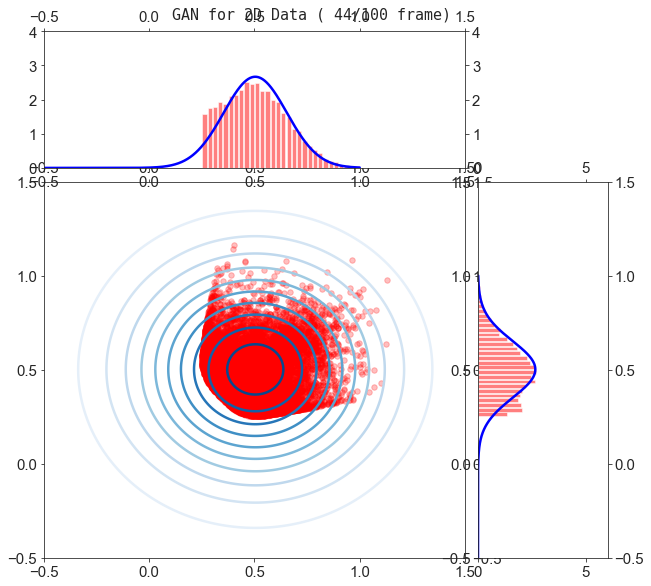

Epoch 880: D_loss=0.6918, G_loss=0.6949, D(x): 0.500, D(G(z)): 0.499/0.499


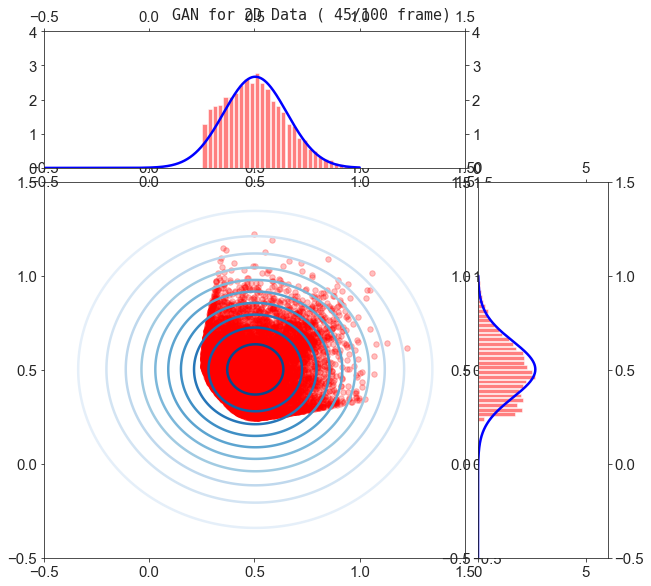

Epoch 900: D_loss=0.6919, G_loss=0.6944, D(x): 0.500, D(G(z)): 0.499/0.499


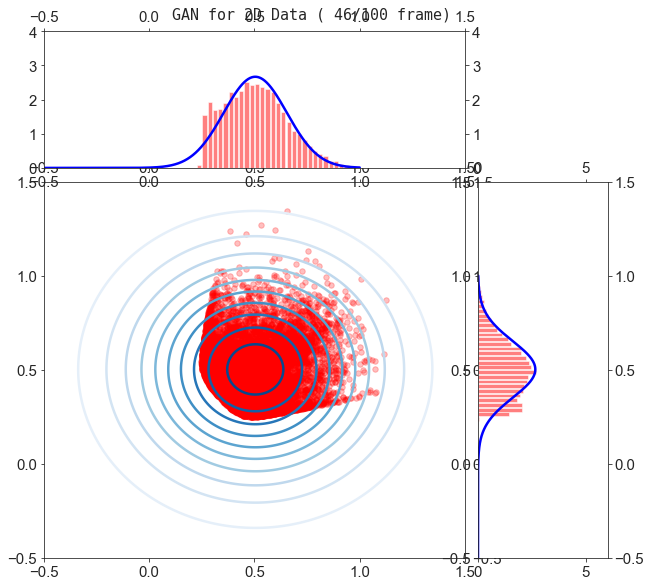

Epoch 920: D_loss=0.6916, G_loss=0.6925, D(x): 0.501, D(G(z)): 0.499/0.500


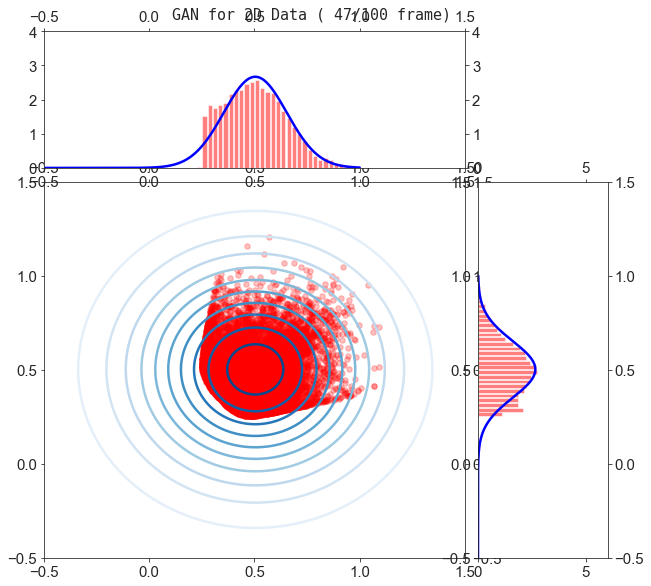

Epoch 940: D_loss=0.6917, G_loss=0.6928, D(x): 0.501, D(G(z)): 0.500/0.500


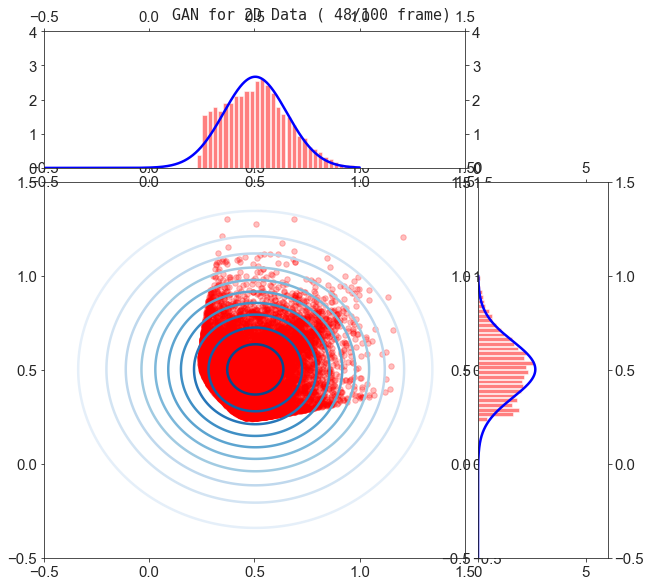

Epoch 960: D_loss=0.6919, G_loss=0.6966, D(x): 0.501, D(G(z)): 0.499/0.498


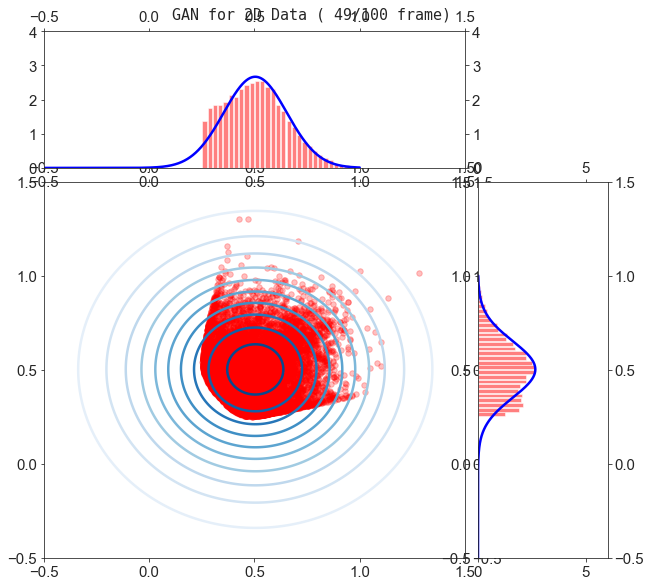

Epoch 980: D_loss=0.6917, G_loss=0.6943, D(x): 0.501, D(G(z)): 0.499/0.499


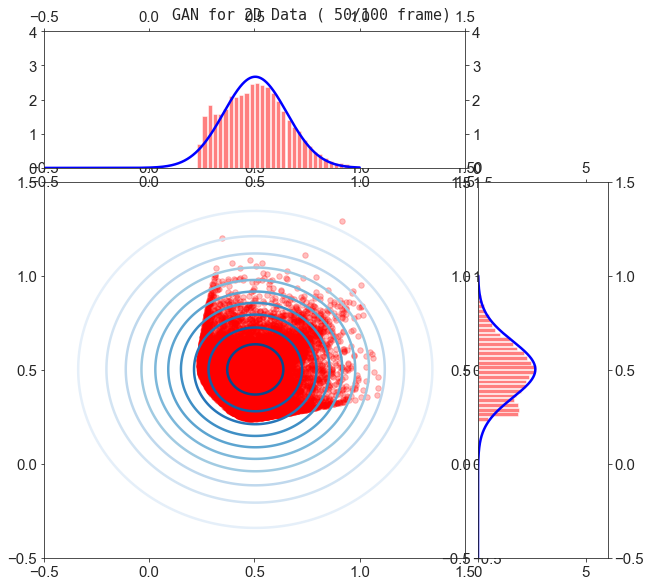

Epoch 1000: D_loss=0.6919, G_loss=0.6926, D(x): 0.502, D(G(z)): 0.500/0.500


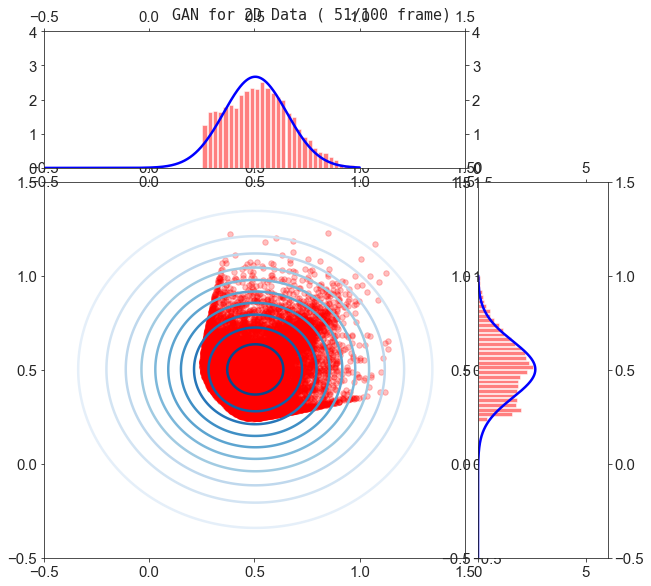

Epoch 1020: D_loss=0.6922, G_loss=0.6913, D(x): 0.499, D(G(z)): 0.498/0.501


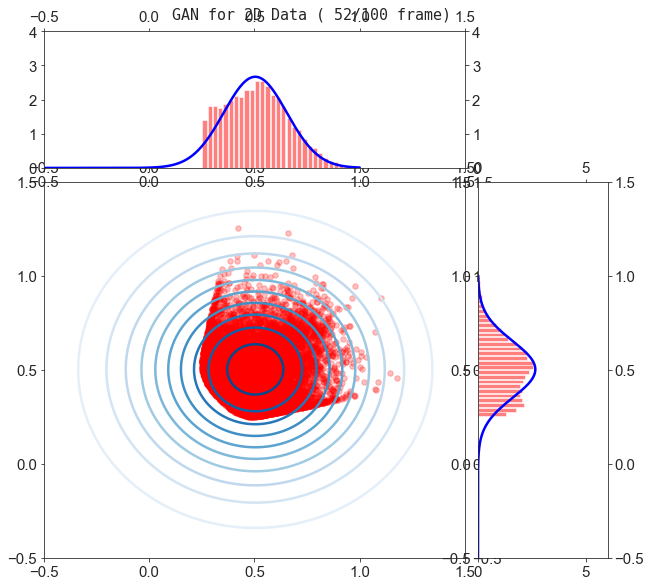

Epoch 1040: D_loss=0.6918, G_loss=0.6928, D(x): 0.501, D(G(z)): 0.500/0.500


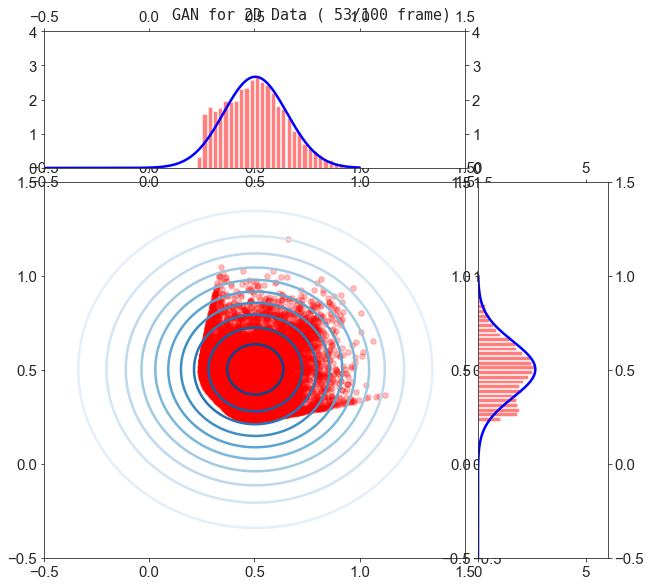

Epoch 1060: D_loss=0.6919, G_loss=0.6932, D(x): 0.501, D(G(z)): 0.499/0.500


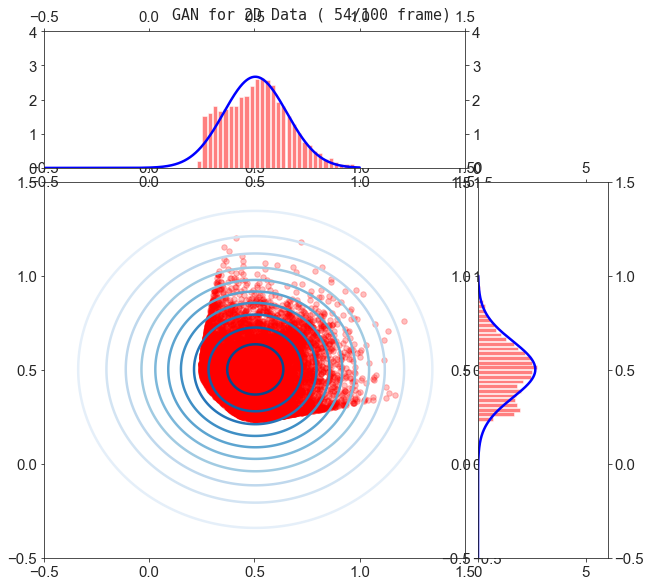

Epoch 1080: D_loss=0.6923, G_loss=0.6936, D(x): 0.501, D(G(z)): 0.500/0.500


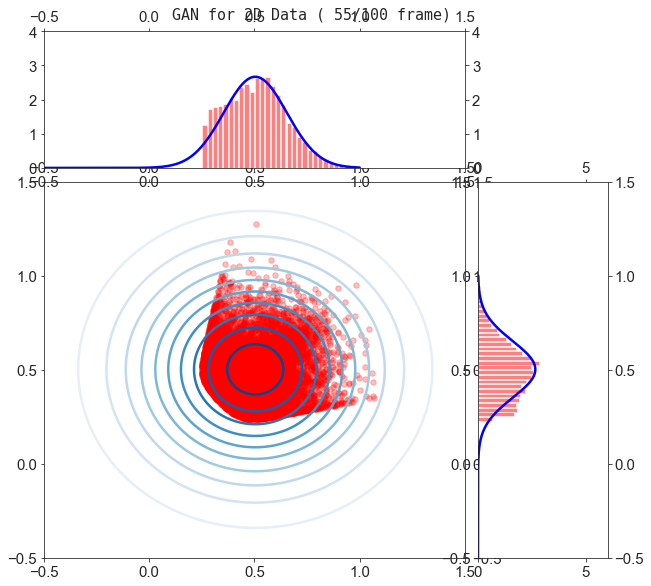

Epoch 1100: D_loss=0.6920, G_loss=0.6952, D(x): 0.501, D(G(z)): 0.500/0.499


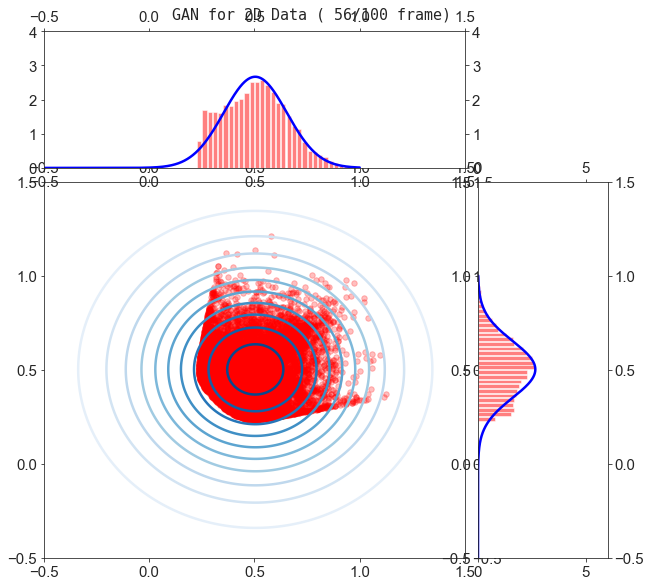

Epoch 1120: D_loss=0.6919, G_loss=0.6907, D(x): 0.500, D(G(z)): 0.499/0.501


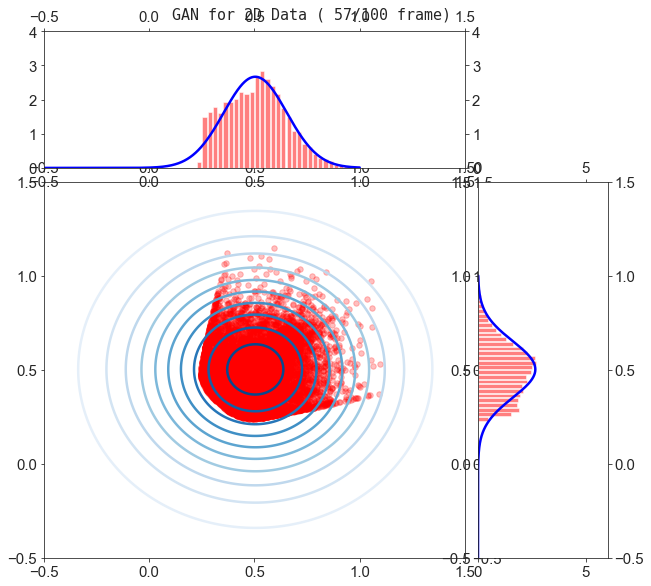

Epoch 1140: D_loss=0.6920, G_loss=0.6931, D(x): 0.500, D(G(z)): 0.499/0.500


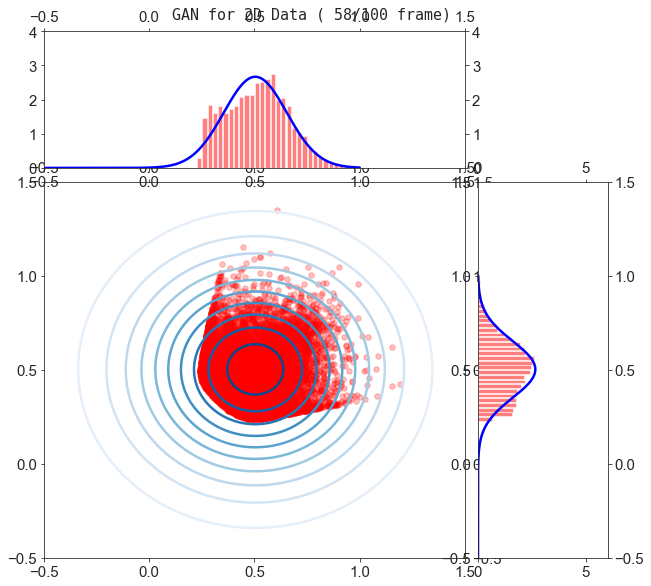

Epoch 1160: D_loss=0.6922, G_loss=0.6987, D(x): 0.503, D(G(z)): 0.502/0.497


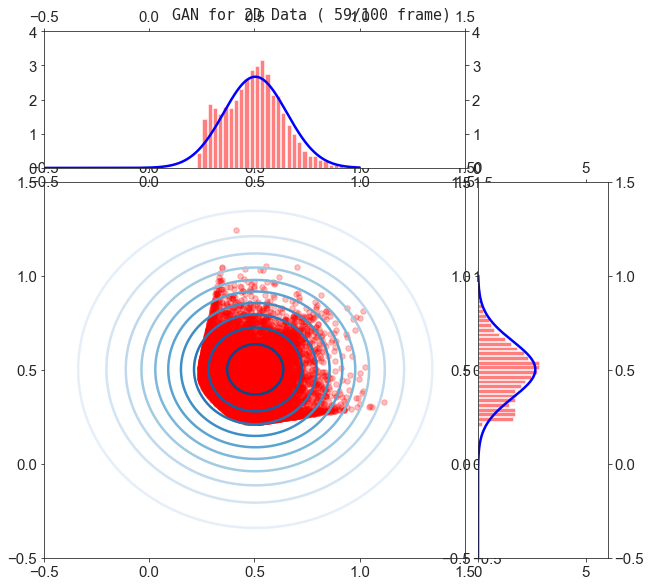

Epoch 1180: D_loss=0.6923, G_loss=0.6940, D(x): 0.500, D(G(z)): 0.499/0.500


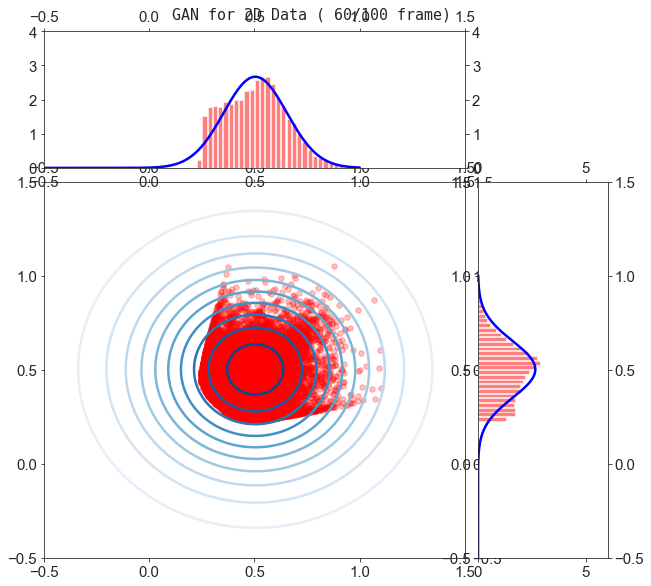

Epoch 1200: D_loss=0.6922, G_loss=0.7030, D(x): 0.504, D(G(z)): 0.503/0.495


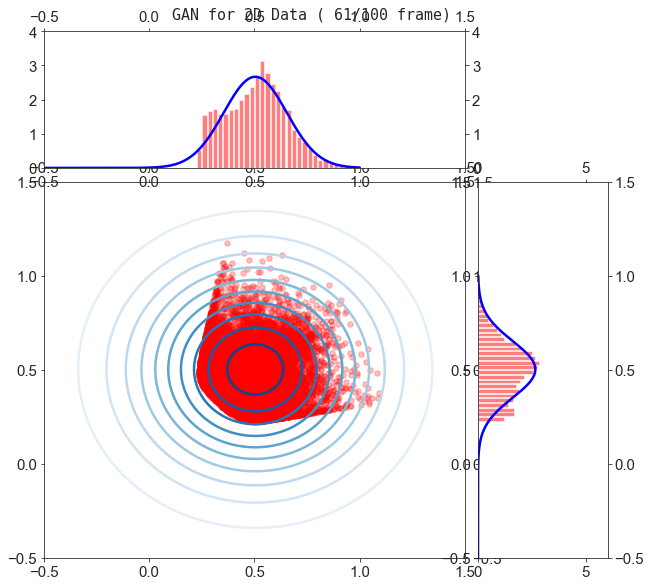

Epoch 1220: D_loss=0.6921, G_loss=0.6927, D(x): 0.501, D(G(z)): 0.500/0.500


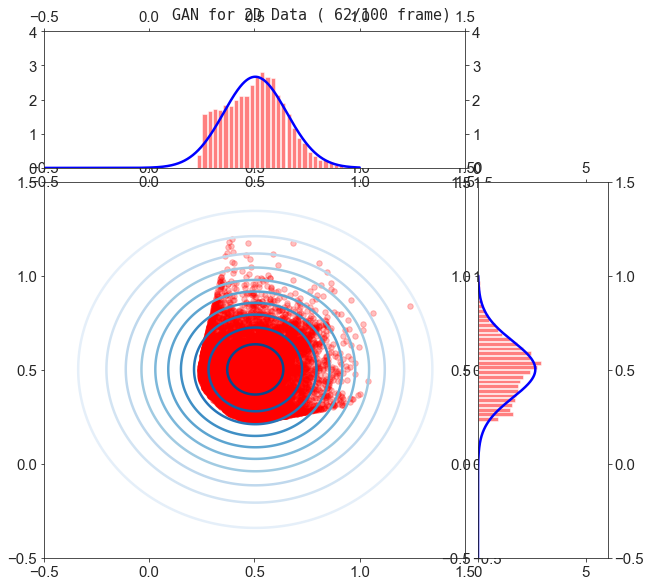

Epoch 1240: D_loss=0.6922, G_loss=0.6911, D(x): 0.499, D(G(z)): 0.498/0.501


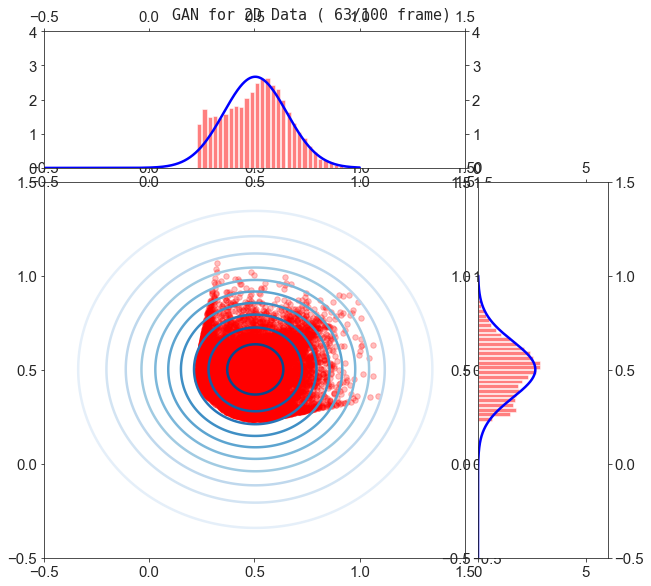

Epoch 1260: D_loss=0.6922, G_loss=0.6910, D(x): 0.499, D(G(z)): 0.498/0.501


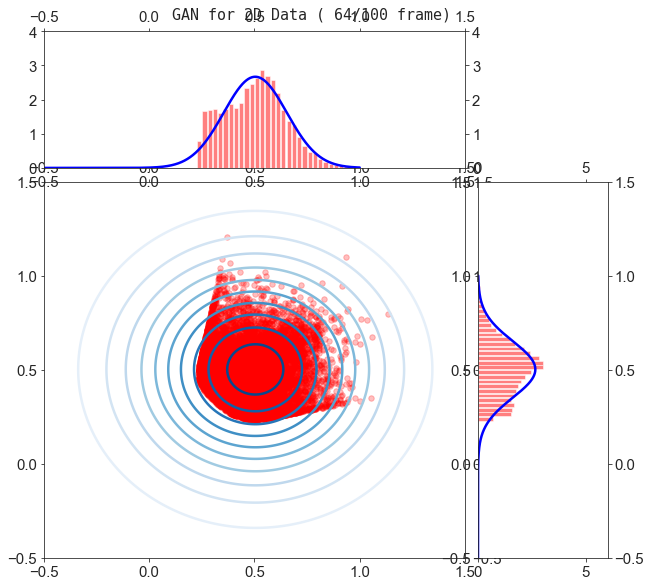

Epoch 1280: D_loss=0.6920, G_loss=0.6942, D(x): 0.500, D(G(z)): 0.499/0.499


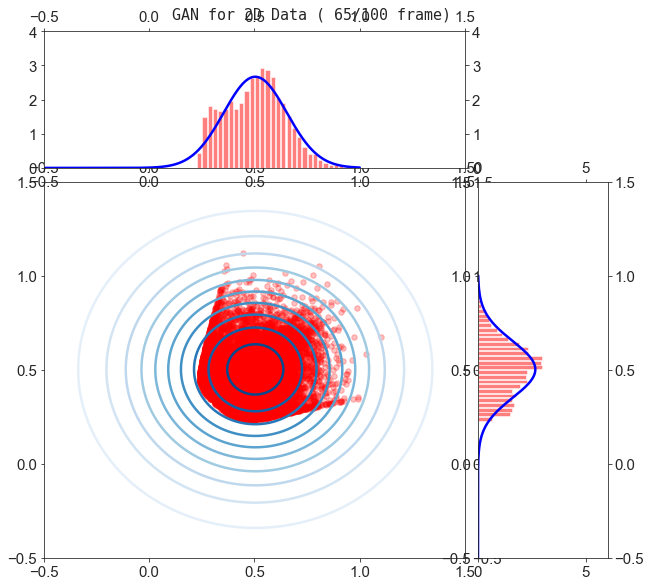

Epoch 1300: D_loss=0.6924, G_loss=0.7035, D(x): 0.506, D(G(z)): 0.505/0.495


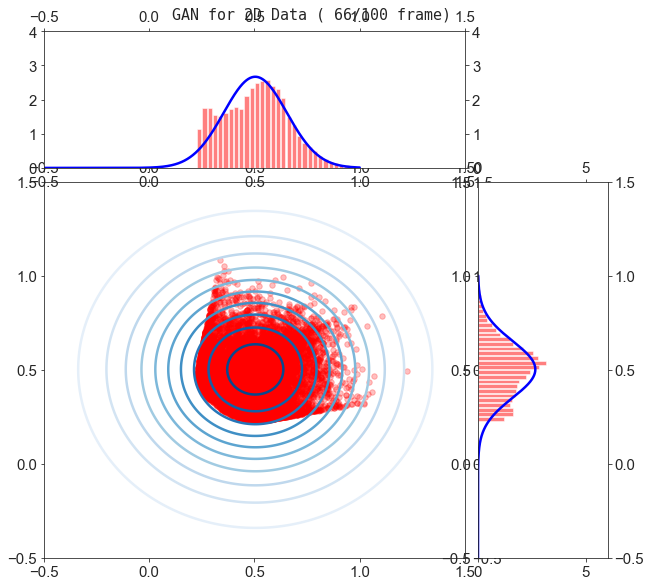

Epoch 1320: D_loss=0.6922, G_loss=0.6957, D(x): 0.501, D(G(z)): 0.500/0.499


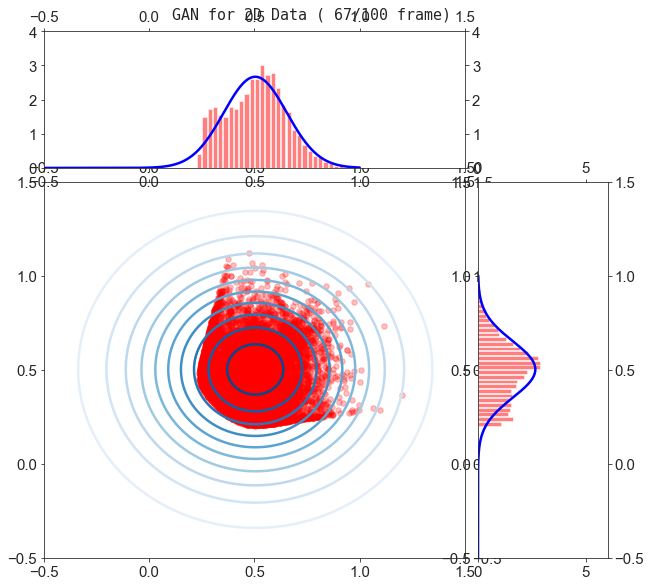

Epoch 1340: D_loss=0.6922, G_loss=0.7010, D(x): 0.505, D(G(z)): 0.504/0.496


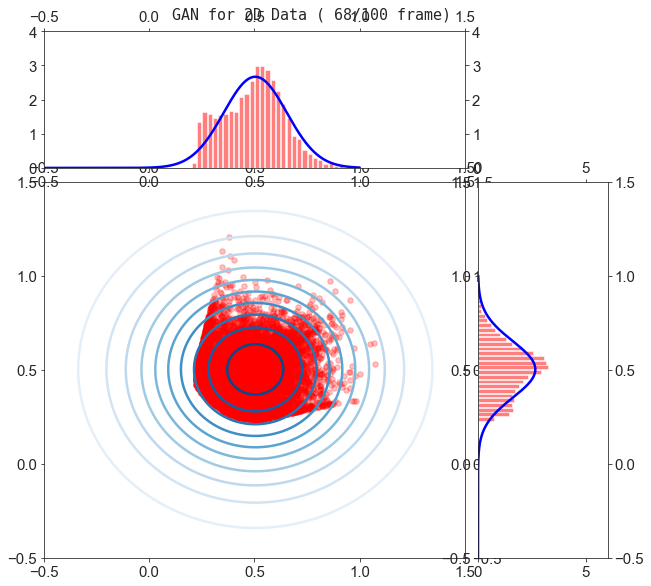

Epoch 1360: D_loss=0.6923, G_loss=0.6960, D(x): 0.500, D(G(z)): 0.499/0.499


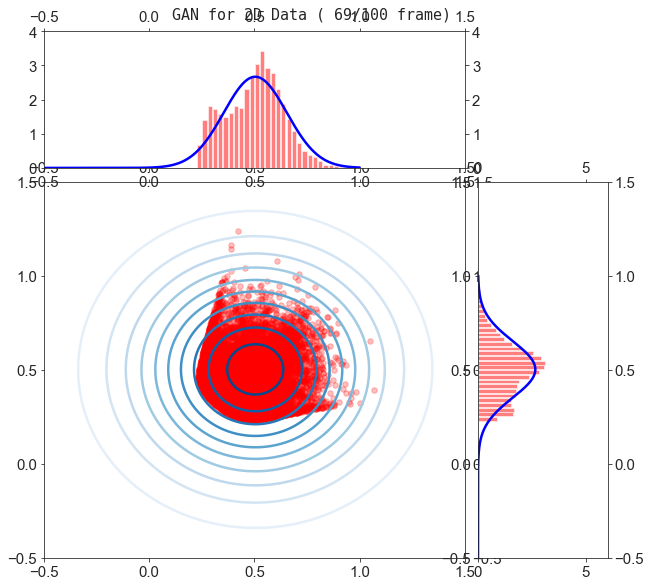

Epoch 1380: D_loss=0.6924, G_loss=0.6924, D(x): 0.499, D(G(z)): 0.499/0.500


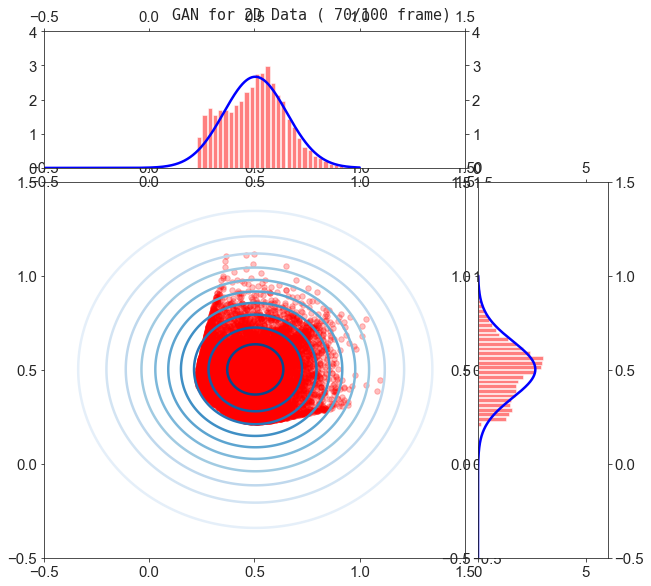

Epoch 1400: D_loss=0.6922, G_loss=0.7029, D(x): 0.505, D(G(z)): 0.504/0.495


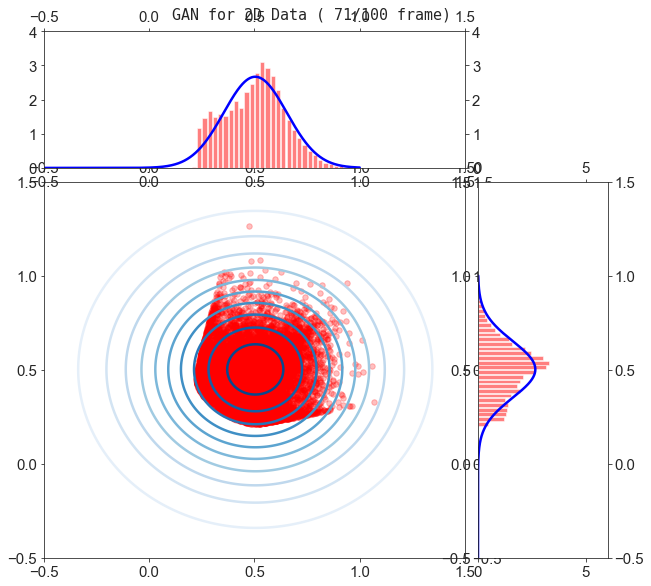

Epoch 1420: D_loss=0.6924, G_loss=0.7032, D(x): 0.504, D(G(z)): 0.503/0.495


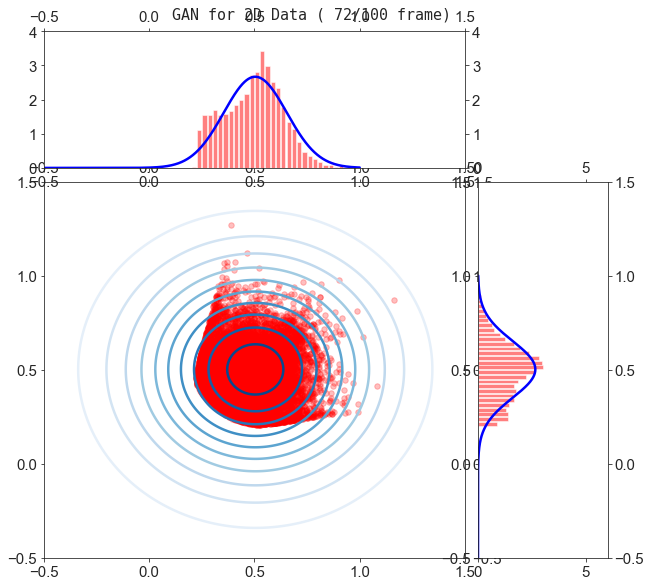

Epoch 1440: D_loss=0.6924, G_loss=0.7054, D(x): 0.506, D(G(z)): 0.505/0.494


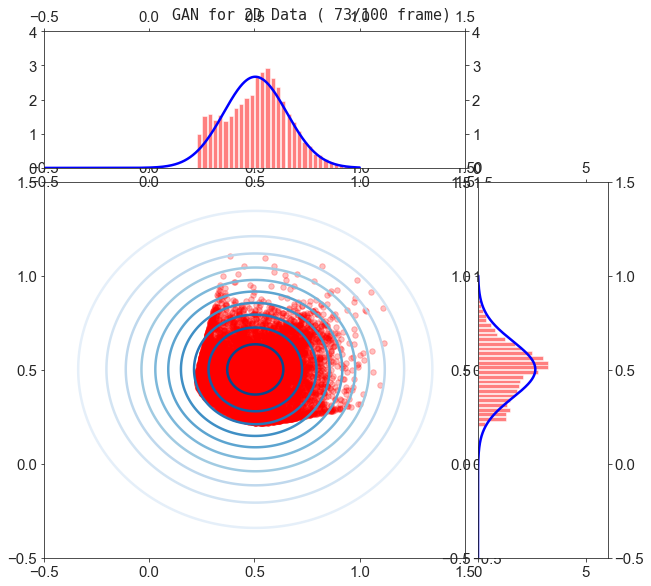

Epoch 1460: D_loss=0.6923, G_loss=0.6987, D(x): 0.500, D(G(z)): 0.499/0.497


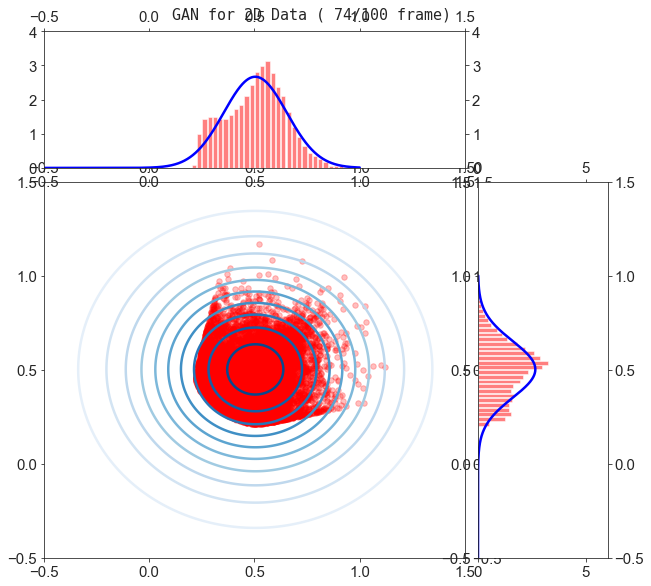

Epoch 1480: D_loss=0.6923, G_loss=0.6959, D(x): 0.501, D(G(z)): 0.500/0.499


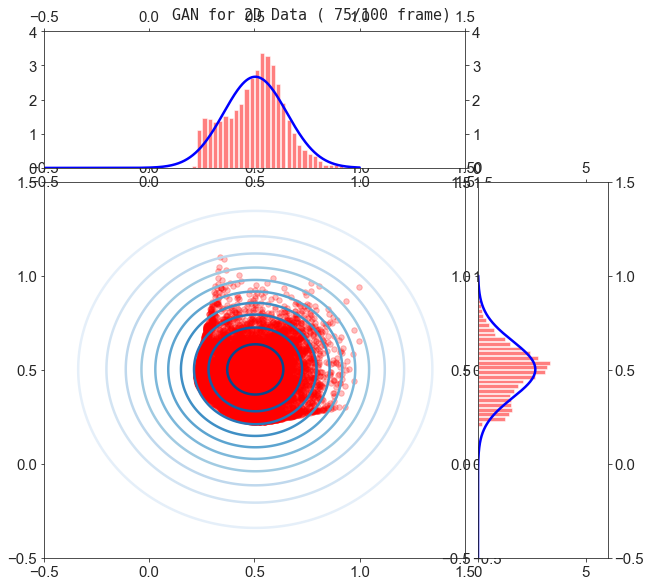

Epoch 1500: D_loss=0.6925, G_loss=0.6972, D(x): 0.501, D(G(z)): 0.501/0.498


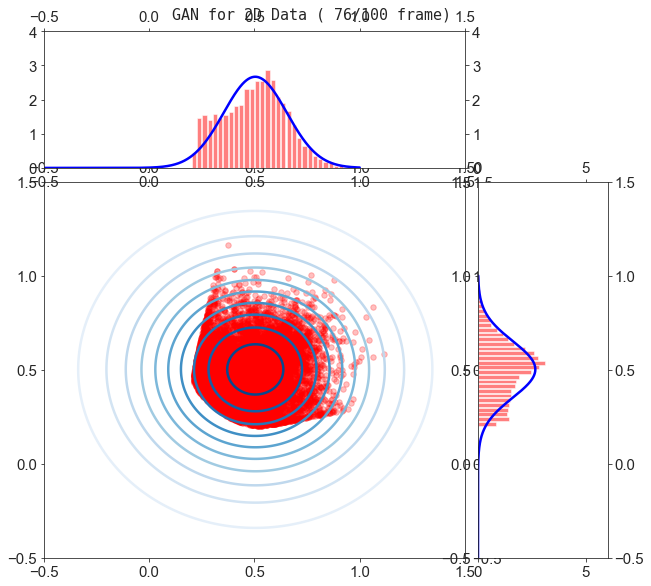

Epoch 1520: D_loss=0.6922, G_loss=0.6992, D(x): 0.502, D(G(z)): 0.501/0.497


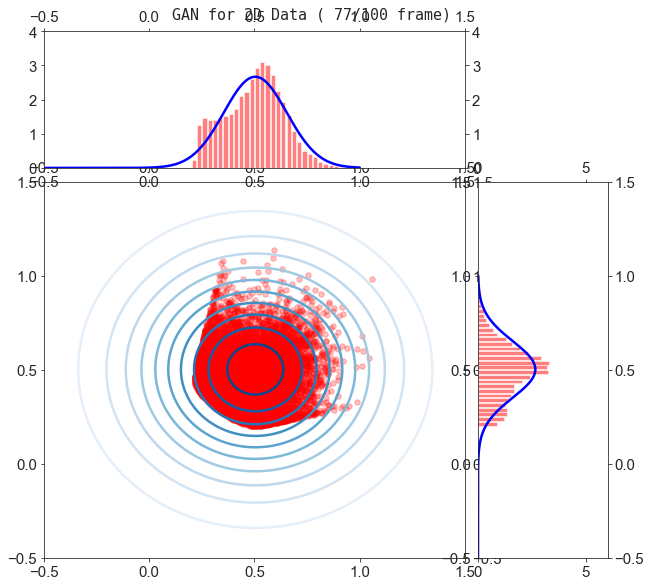

Epoch 1540: D_loss=0.6924, G_loss=0.6958, D(x): 0.501, D(G(z)): 0.500/0.499


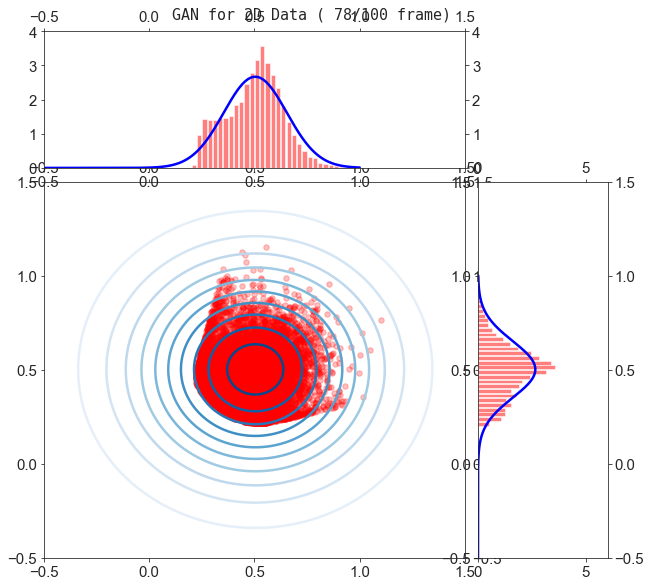

Epoch 1560: D_loss=0.6924, G_loss=0.6947, D(x): 0.501, D(G(z)): 0.501/0.499


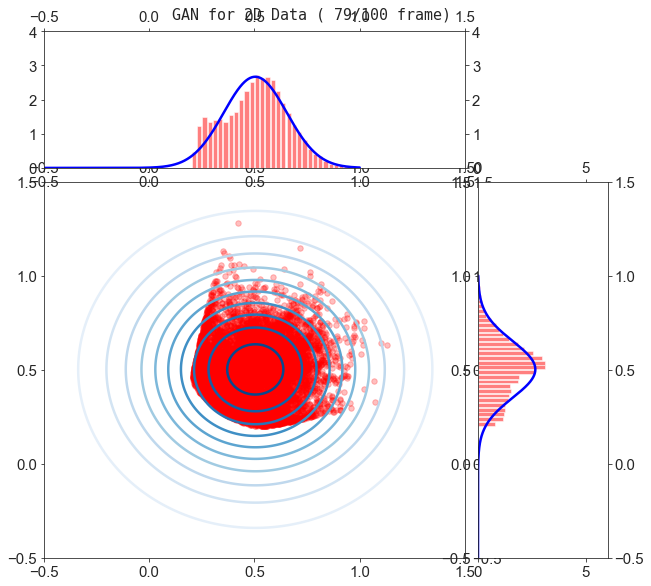

Epoch 1580: D_loss=0.6919, G_loss=0.7005, D(x): 0.503, D(G(z)): 0.501/0.496


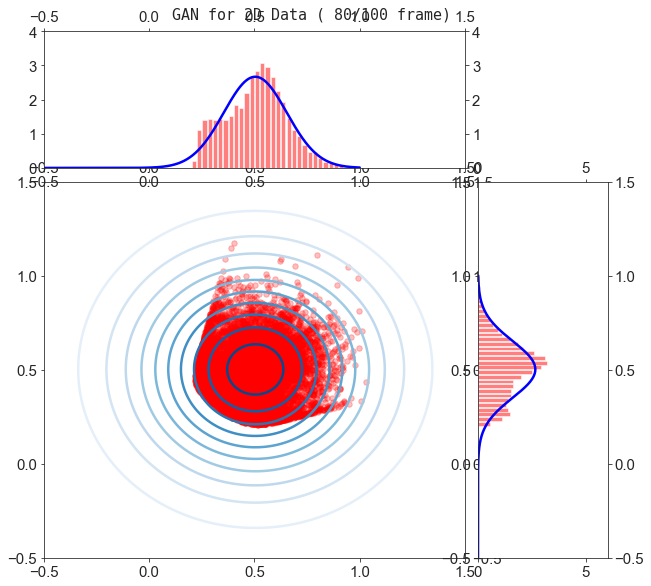

Epoch 1600: D_loss=0.6924, G_loss=0.7014, D(x): 0.504, D(G(z)): 0.503/0.496


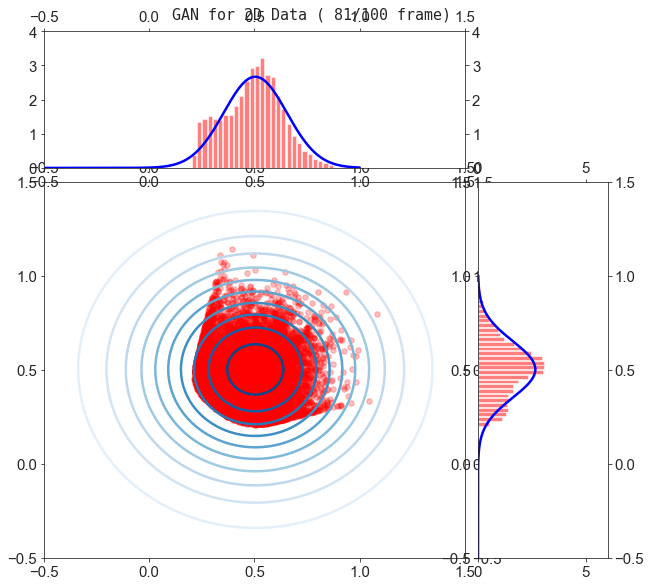

Epoch 1620: D_loss=0.6925, G_loss=0.7062, D(x): 0.507, D(G(z)): 0.506/0.494


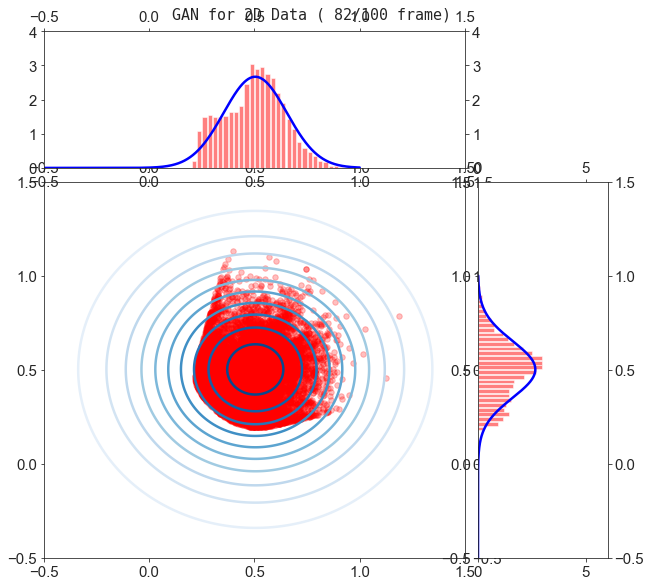

Epoch 1640: D_loss=0.6924, G_loss=0.7037, D(x): 0.504, D(G(z)): 0.503/0.495


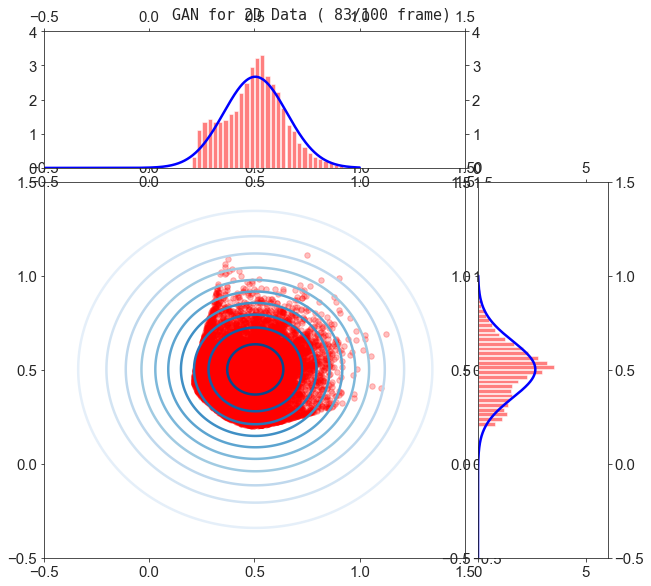

Epoch 1660: D_loss=0.6924, G_loss=0.6948, D(x): 0.500, D(G(z)): 0.500/0.499


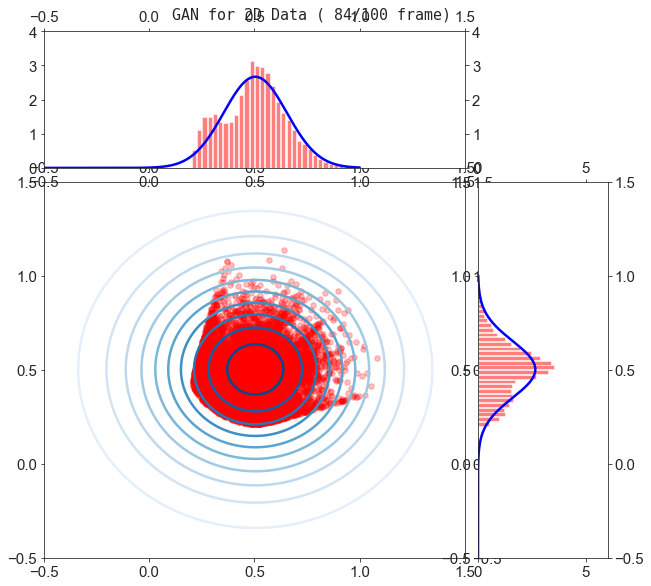

Epoch 1680: D_loss=0.6924, G_loss=0.6879, D(x): 0.498, D(G(z)): 0.497/0.503


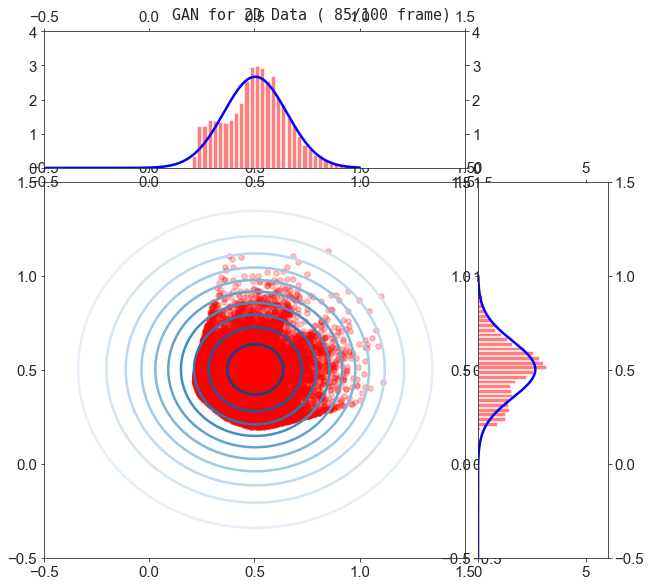

Epoch 1700: D_loss=0.6924, G_loss=0.6871, D(x): 0.496, D(G(z)): 0.495/0.503


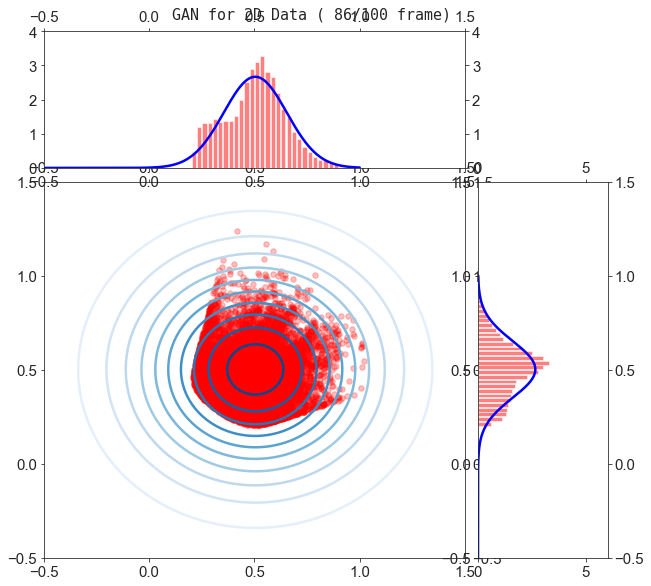

Epoch 1720: D_loss=0.6924, G_loss=0.6835, D(x): 0.495, D(G(z)): 0.494/0.505


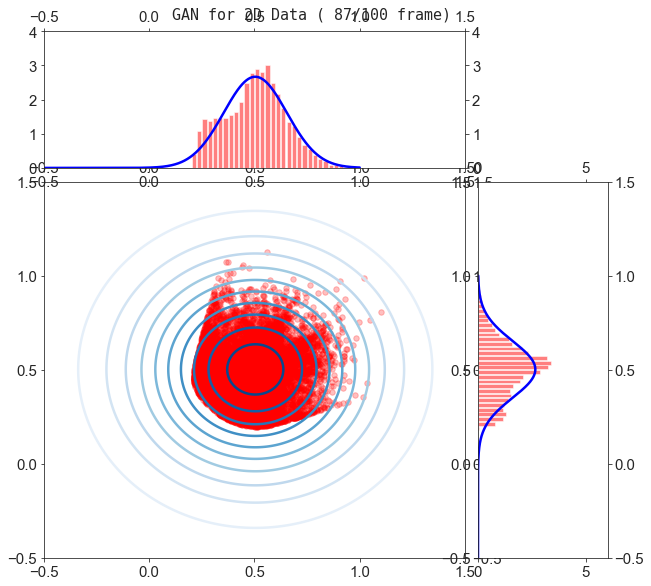

Epoch 1740: D_loss=0.6923, G_loss=0.6936, D(x): 0.501, D(G(z)): 0.500/0.500


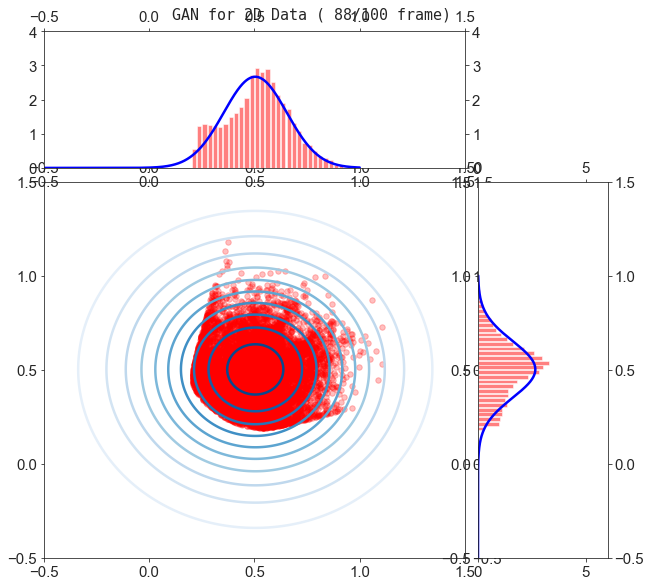

Epoch 1760: D_loss=0.6926, G_loss=0.6839, D(x): 0.496, D(G(z)): 0.495/0.505


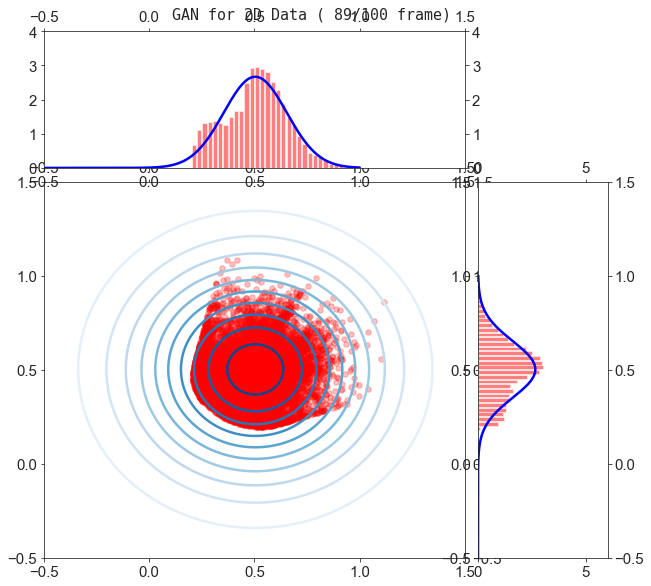

Epoch 1780: D_loss=0.6924, G_loss=0.6894, D(x): 0.499, D(G(z)): 0.498/0.502


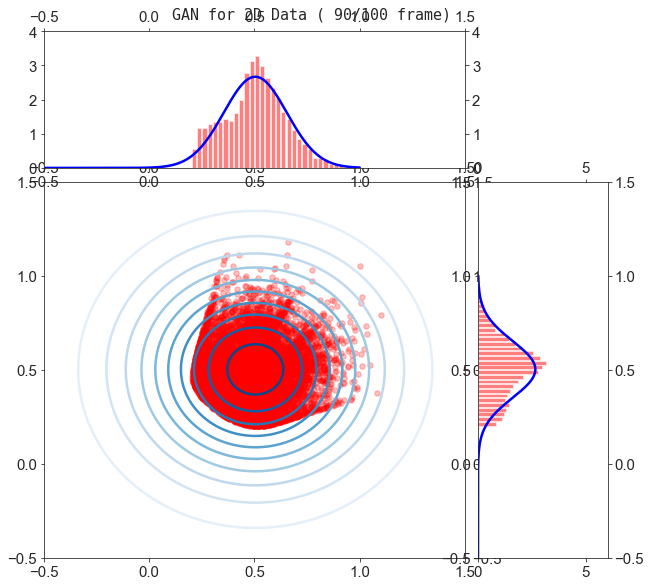

Epoch 1800: D_loss=0.6924, G_loss=0.6884, D(x): 0.497, D(G(z)): 0.497/0.502


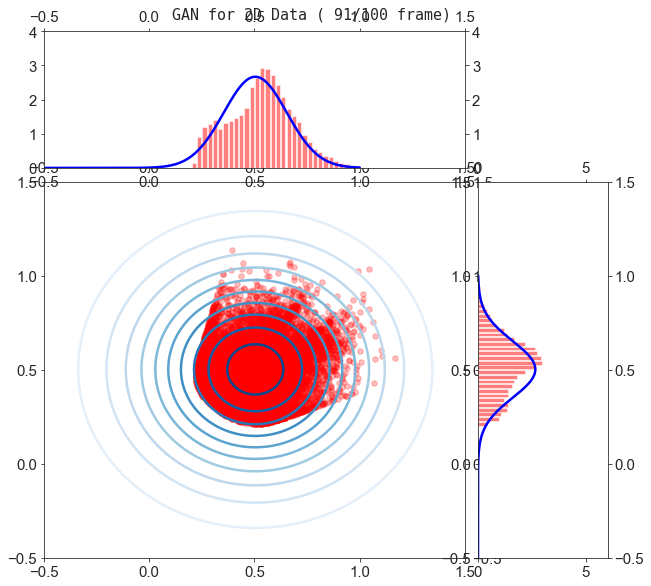

Epoch 1820: D_loss=0.6924, G_loss=0.6906, D(x): 0.499, D(G(z)): 0.499/0.501


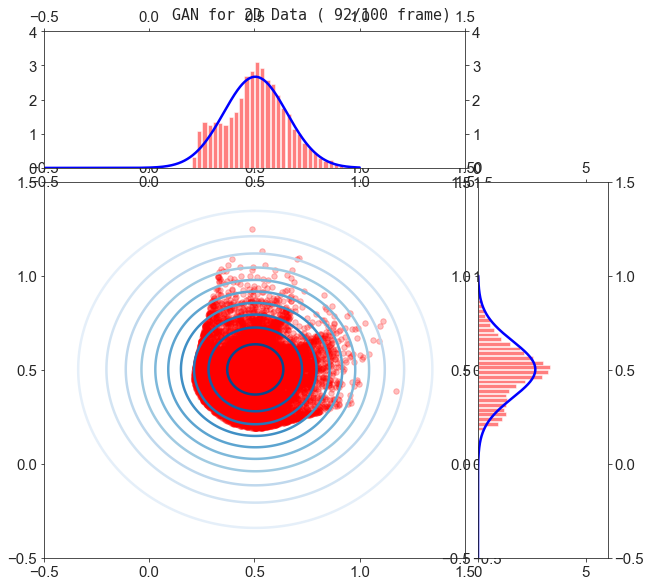

Epoch 1840: D_loss=0.6924, G_loss=0.6867, D(x): 0.497, D(G(z)): 0.496/0.503


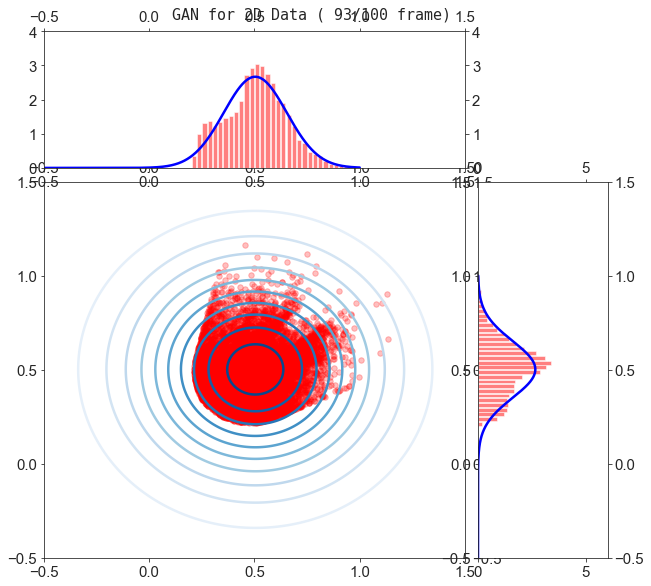

Epoch 1860: D_loss=0.6925, G_loss=0.6924, D(x): 0.499, D(G(z)): 0.498/0.500


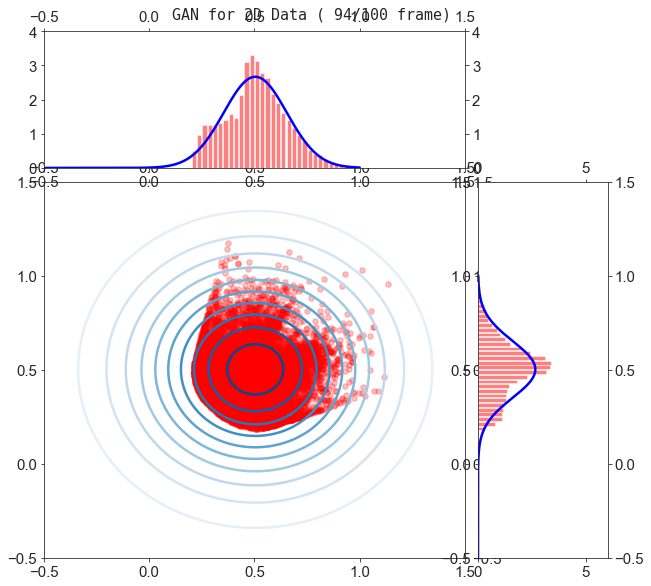

Epoch 1880: D_loss=0.6927, G_loss=0.6741, D(x): 0.490, D(G(z)): 0.490/0.510


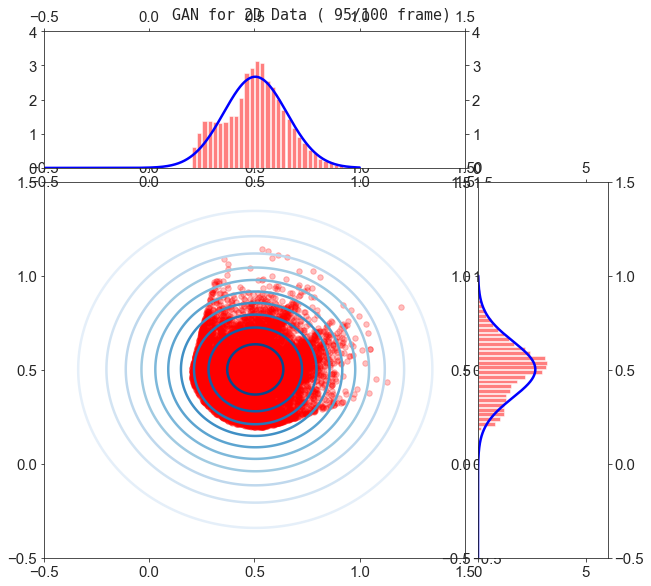

Epoch 1900: D_loss=0.6924, G_loss=0.6891, D(x): 0.498, D(G(z)): 0.497/0.502


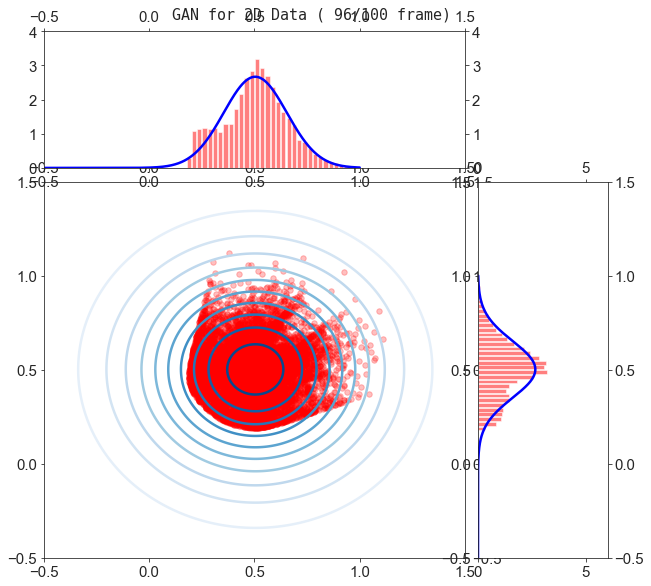

Epoch 1920: D_loss=0.6925, G_loss=0.6882, D(x): 0.499, D(G(z)): 0.499/0.502


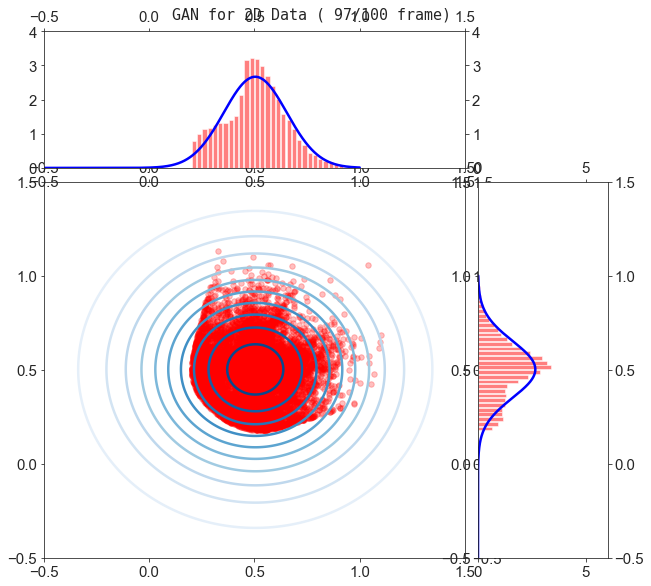

Epoch 1940: D_loss=0.6925, G_loss=0.6915, D(x): 0.499, D(G(z)): 0.498/0.501


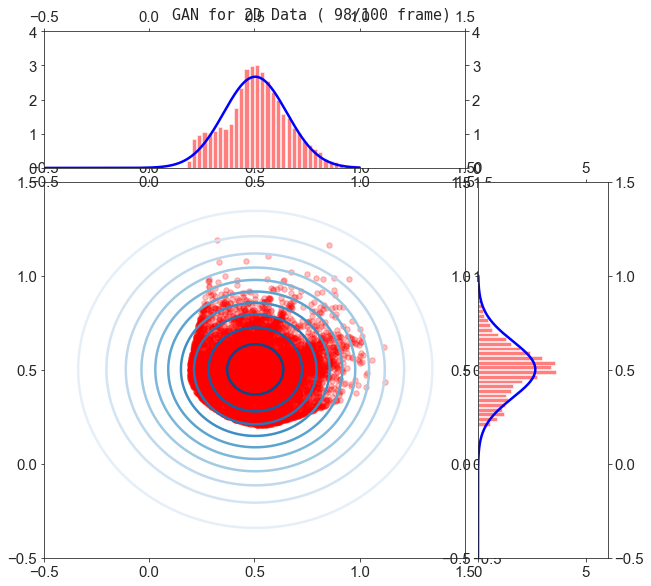

Epoch 1960: D_loss=0.6930, G_loss=0.6723, D(x): 0.488, D(G(z)): 0.487/0.511


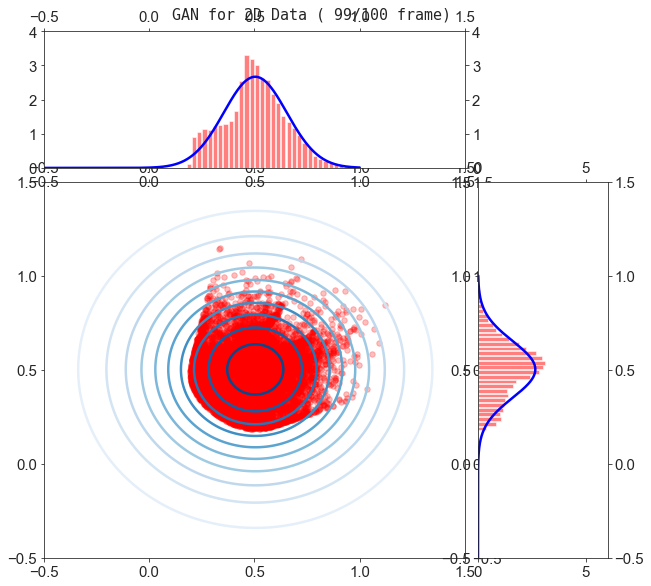

Epoch 1980: D_loss=0.6925, G_loss=0.6868, D(x): 0.496, D(G(z)): 0.495/0.503


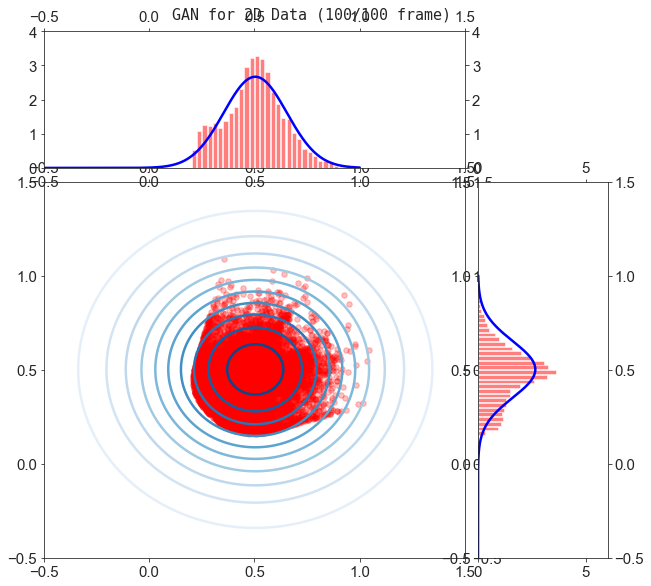

Epoch 2000: D_loss=0.6926, G_loss=0.6927, D(x): 0.498, D(G(z)): 0.498/0.500


In [28]:
num_img=0
d_loss_data = []
g_loss_data = []

for i in range(1, n_epochs+1):
    z_full = base_dist.sample((batch_size,)).to(device)
    if use_minibatches:
        z_dataset = TensorDataset(z_full)
        z_loader = MyDataLoader(z_dataset)
    
    # train discriminator
    generator.eval();
    discriminator.train();
    
    if use_minibatches:
        for x_r, z in zip(x_real_dataloader, z_loader):
            x_r, z = x_r[0], z[0]
            D_loss, D_x, D_G_z_1 = train_discriminator(x_r, z)
    else:
        D_loss, D_x, D_G_z_1 = train_discriminator(x_real, z_full)

    # train generator
    generator.train();
    discriminator.eval();
    
    if use_minibatches:
        for z in z_loader:
            z = z[0]
            G_loss, D_G_z_2 = train_generator(z)
    else:
        G_loss, D_G_z_2 = train_generator(z_full)
    d_loss_data.append(D_loss)  
    g_loss_data.append(G_loss)  
  
    if i % int(n_epochs/100) == 0:
        # num_img += 1
        plot_data(np.array(x_real), generator(z_full).detach().numpy(), '%3d/%d'%(i/int(n_epochs/100), 100))
        print(f'Epoch {i}: D_loss={D_loss:0.4f}, G_loss={G_loss:0.4f}, '
              f'D(x): {D_x:0.3f}, D(G(z)): {D_G_z_1:0.3f}/{D_G_z_2:0.3f}')

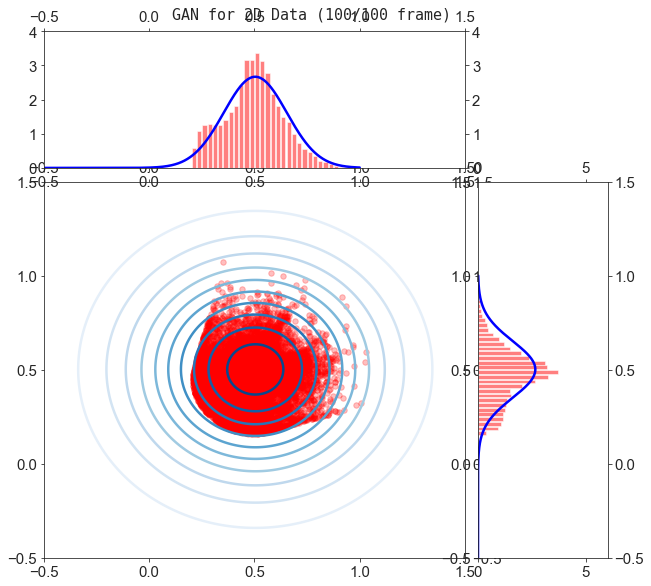

In [29]:
plot_data(np.array(x_real), generator(z_full).detach().numpy(), '%3d/%d'%(100, 100), 'plot_gan2d/%d.png'%100)


In [32]:
z = base_dist.sample((n_samples,)).to(device)
generator.eval()
with torch.no_grad():
    x_fake = generator(z).detach().cpu().numpy()
xf, yf = x_fake[:,0], x_fake[:,1]

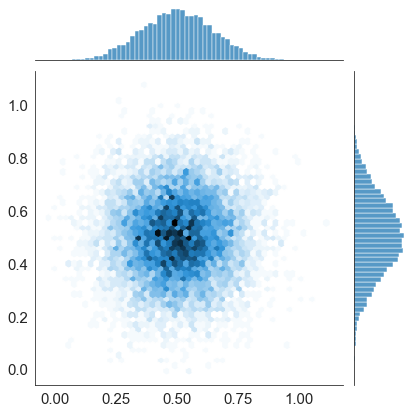

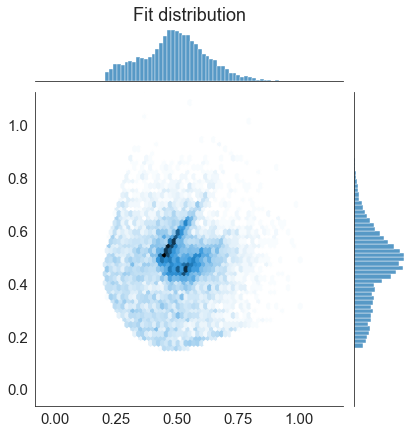

In [33]:
sns.jointplot(x=xr, y=yr, kind="hex");
g = sns.jointplot(x=xf, y=yf, kind="hex", xlim=xlim, ylim=ylim);
g.ax_marg_x.set_title('Fit distribution');
# plt.savefig('fit_dist.svg')

In [35]:
# from ndtest import *
# ks2d2s(np.array(x_real[:,0]), np.array(x_real[:,1]), np.array(x_fake[:,0]), np.array(x_fake[:,1])), ks2d2s(np.array(x_real[:,0]), np.array(x_real[:,1]), np.array(x_fake[:,0]), np.array(x_fake[:,1]))